# Preliminary Gene Background Analysis

Unlike the pre-processing of the preliminary dataset, the complete datasets are loaded (including the 'empty' droplets generated by the Chromium) to investigate the top genes present in the background of each dataset.



[Nasal Biopsies Preprocessing](#Nasal-Biopsies)  
[Nasal Brushings Preprocessing](#Nasal-Brushings)  
[Proximal Biopsies Preprocessing](#Proximal-Biopsies)  
[Intermediate Biopsies Preprocessing](#Intermediate-Biopsies)  
[Distal Brushings Preprocessing](#Distal-Brushings)  
[Concatenate Full Dataset](#Concatenate-full-dataset) 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

scanpy==1.4+39.gc70f24b anndata==0.6.18 numpy==1.16.2 scipy==1.2.1 pandas==0.24.1 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 


In [2]:
def remove_RB_genes(
    df,
    path_to_RB_genes_file = '/data/deprez_data/HCA/PeerLab_analysis/RB_genes'
):
    """Removes all columns of RB genes as listed in the RB gene file.
    RB_genes_file should contain gene names, one gene name per line.
    Returns RB gene-depleted df, pd.Series with number of counts removed 
    per cell, and a list of RB genes that were in the df."""
    with open(path_to_RB_genes_file,'r') as file:
        lines = file.readlines()
    genes = [x.rstrip('\n') for x in lines]
    RB_genes_in_df = []
    df_genes = df.columns
    for gene in genes:
        if gene in df_genes:
            RB_genes_in_df.append(gene)
    # df_genes = df.columns
    # ribosomal_genes = []
    # for GENE in df_genes:
    #     if GENE[:3] in ['RPL','RPS']:
    #         ribosomal_genes.append(GENE)
    # store the number of RB molecules per cell in a Series object with cell labels as indices
    counts_removed_per_cell = pd.Series(index = df.index)
    for cell in df.index:
        counts_removed_per_cell[cell] = sum(df.loc[cell][RB_genes_in_df])
    # now drop all columns with RB genes:
    df_RB_depleted = df.drop(columns = RB_genes_in_df)
    return df_RB_depleted, counts_removed_per_cell, RB_genes_in_df


In [3]:
os.chdir('/data/deprez_data/HCA/Data/')
outsPath = 'outs/raw_gene_bc_matrices/ucagenomix-cellranger-hg19-1.3.0/'
outsPathFilter = 'outs/filtered_gene_bc_matrices/ucagenomix-cellranger-hg19-1.3.0/'
sc.settings.set_figure_params(dpi=80)

In [4]:
columns = ["background", "nb_cells", 'nb_genes', 'position', 'donor', 'method']
index = ['D322_Biop_Nas1', 'D322_Biop_Pro1', 'D322_Biop_Int1', 
                                   'D326_Biop_Pro1', 'D326_Biop_Int1', 'D326_Brus_Dis1',
                                   'D337_Brus_Dis1',
                                   'D339_Biop_Nas1', 'D339_Biop_Pro1', 'D339_Biop_Int1', 'D339_Brus_Dis1',
                                   'D344_Biop_Nas1', 'D344_Biop_Pro1', 'D344_Biop_Int1', 'D344_Brus_Dis1',
                                   'D345_Biop_Nas1',
                                   'D353_Brus_Nas1', 'D353_Biop_Pro1', 'D353_Biop_Int2', 'D353_Brus_Dis1',
                                   'D354_Biop_Pro1', 'D354_Biop_Int2', 'D354_Brus_Dis1',
                                   'D363_Brus_Nas1', 'D363_Biop_Pro1', 'D363_Biop_Int2', 'D363_Brus_Dis1',
                                   'D367_Brus_Nas1', 'D367_Biop_Pro1', 'D367_Biop_Int1', 'D367_Brus_Dis1',
                                   'D372_Brus_Nas1', 'D372_Biop_Pro1', 'D372_Biop_Int1', 'D372_Biop_Int2', 'D372_Brus_Dis1']
df_ = pd.DataFrame(index=index, columns=columns)
df_ = df_.fillna(0)

# Nasal Biopsies
[Back to top](#Full-Aggregate)

In [5]:
D322_Biop_Nas1 = sc.read_10x_mtx(
    './D322_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Nas1.var_names_make_unique()
D322_Biop_Nas1.obs['manip'] = 'D322_Biop_Nas1'
D322_Biop_Nas1.obs['position'] = 'Nasal'
D322_Biop_Nas1.obs['method'] = 'Biopsy'
D322_Biop_Nas1.obs['donor'] = 'D322'
D322_Biop_Nas1.obs['name'] = ['D322_Biop_Nas1_' + s for s in list(D322_Biop_Nas1.obs.index)]
D322_Biop_Nas1.obs_names = D322_Biop_Nas1.obs['name']
D322_Biop_Nas1

filtered = sc.read_10x_mtx(
    './D322_Biop_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D322_Biop_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D322_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [6]:
D322_Biop_Nas1.obs['n_counts'] = D322_Biop_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=0)
D322_Biop_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [7]:
qc_df = D322_Biop_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(359712, 3)

(1796, 3)
(15798, 3)


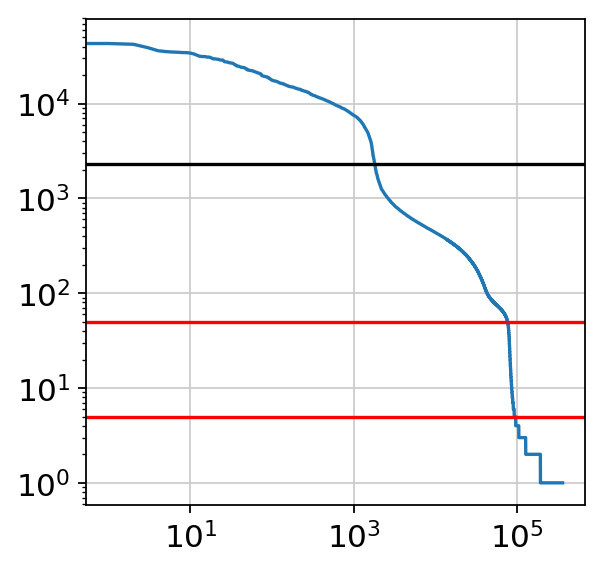

In [8]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=50, color='r') # Limit to empty droplets
plt.axhline(y=5, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [9]:
empty = D322_Biop_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [10]:
D322_Biop_Nas1 = D322_Biop_Nas1[qc_df_subsetFull.index.tolist()]
D322_Biop_Nas1.obs['background'] = back
D322_Biop_Nas1.obs['empty_droplets'] = empty.shape[0]

D322_Biop_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


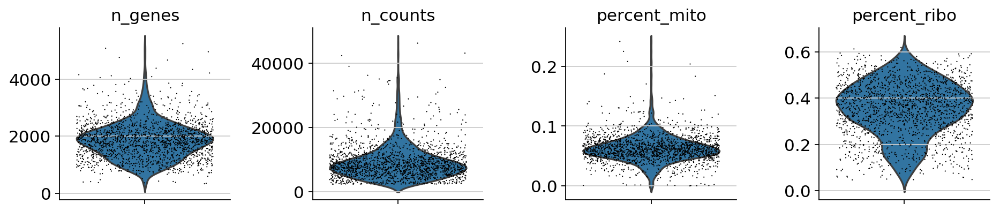

In [11]:
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=0)
mito_genes = D322_Biop_Nas1.var_names.str.startswith('MT-')
D322_Biop_Nas1.obs['percent_mito'] = np.sum(
    D322_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Nas1.X, axis=1).A1
D322_Biop_Nas1.obs['n_counts'] = D322_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Nas1.to_df())
ribo_genes = D322_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D322_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Nas1.X, axis=1).A1
D322_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [12]:
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=500)
D322_Biop_Nas1 = D322_Biop_Nas1[D322_Biop_Nas1.obs['n_counts'] < 40000, :]
D322_Biop_Nas1 = D322_Biop_Nas1[D322_Biop_Nas1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D322_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Nas1) # log transform the data
D322_Biop_Nas1.raw = D322_Biop_Nas1
D322_Biop_Nas1_raw = D322_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 10 cells that have less than 500 genes expressed


In [13]:
D322_Biop_Nas1 = D322_Biop_Nas1[:, D322_Biop_Nas1.var['ribo_genes']]
D322_Biop_Nas1

View of AnnData object with n_obs × n_vars = 1779 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [14]:
D339_Biop_Nas1 = sc.read_10x_mtx(
    './D339_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Nas1.var_names_make_unique()
D339_Biop_Nas1.obs['manip'] = 'D339_Biop_Nas1'
D339_Biop_Nas1.obs['position'] = 'Nasal'
D339_Biop_Nas1.obs['method'] = 'Biopsy'
D339_Biop_Nas1.obs['donor'] = 'D339'
D339_Biop_Nas1.obs['name'] = ['D339_Biop_Nas1_' + s for s in list(D339_Biop_Nas1.obs.index)]
D339_Biop_Nas1.obs_names = D339_Biop_Nas1.obs['name']
D339_Biop_Nas1

filtered = sc.read_10x_mtx(
    './D339_Biop_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D339_Biop_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D339_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [15]:
D339_Biop_Nas1.obs['n_counts'] = D339_Biop_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=0)
D339_Biop_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [16]:
qc_df = D339_Biop_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(341324, 3)

(1916, 3)
(9840, 3)


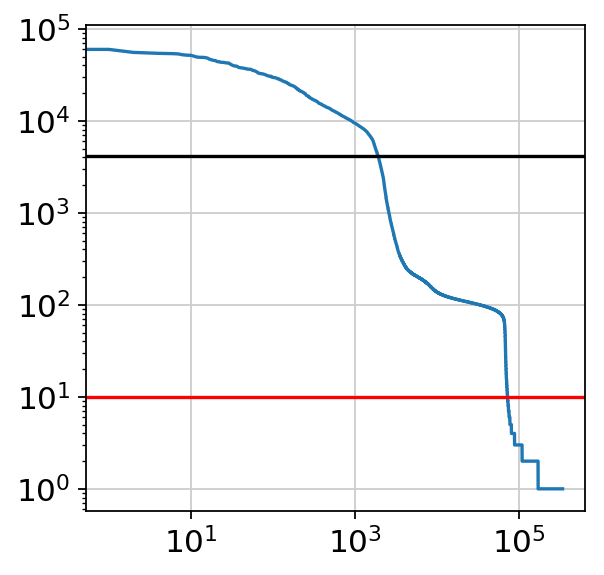

In [17]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [18]:
empty = D339_Biop_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [19]:
D339_Biop_Nas1 = D339_Biop_Nas1[qc_df_subsetFull.index.tolist()]
D339_Biop_Nas1.obs['background'] = back
D339_Biop_Nas1.obs['empty_droplets'] = empty.shape[0]

D339_Biop_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


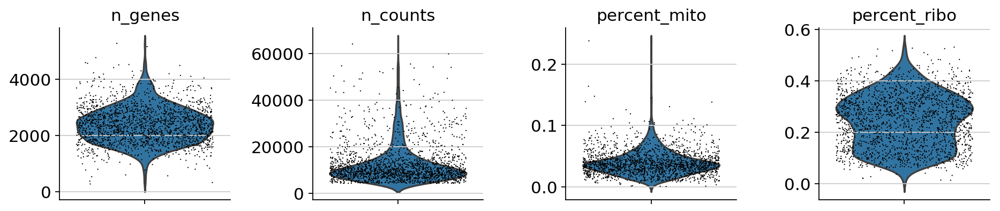

In [20]:
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=0)
mito_genes = D339_Biop_Nas1.var_names.str.startswith('MT-')
D339_Biop_Nas1.obs['percent_mito'] = np.sum(
    D339_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Nas1.X, axis=1).A1
D339_Biop_Nas1.obs['n_counts'] = D339_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Nas1.to_df())
ribo_genes = D339_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D339_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Nas1.X, axis=1).A1
D339_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [21]:
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=500)
D339_Biop_Nas1 = D339_Biop_Nas1[D339_Biop_Nas1.obs['n_counts'] < 40000, :]
D339_Biop_Nas1 = D339_Biop_Nas1[D339_Biop_Nas1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D339_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Nas1) # log transform the data
D339_Biop_Nas1.raw = D339_Biop_Nas1
D339_Biop_Nas1_raw = D339_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 3 cells that have less than 500 genes expressed


In [22]:
D339_Biop_Nas1 = D339_Biop_Nas1[:, D339_Biop_Nas1.var['ribo_genes']]
D339_Biop_Nas1

View of AnnData object with n_obs × n_vars = 1878 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [23]:
D344_Biop_Nas1 = sc.read_10x_mtx(
    './D344_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Nas1.var_names_make_unique()
D344_Biop_Nas1.obs['manip'] = 'D344_Biop_Nas1'
D344_Biop_Nas1.obs['position'] = 'Nasal'
D344_Biop_Nas1.obs['method'] = 'Biopsy'
D344_Biop_Nas1.obs['donor'] = 'D344'
D344_Biop_Nas1.obs['name'] = ['D344_Biop_Nas1_' + s for s in list(D344_Biop_Nas1.obs.index)]
D344_Biop_Nas1.obs_names = D344_Biop_Nas1.obs['name']
D344_Biop_Nas1

filtered = sc.read_10x_mtx(
    './D344_Biop_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D344_Biop_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D344_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [24]:
D344_Biop_Nas1.obs['n_counts'] = D344_Biop_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=0)
D344_Biop_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [25]:
qc_df = D344_Biop_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(411337, 3)

(2120, 3)
(16430, 3)


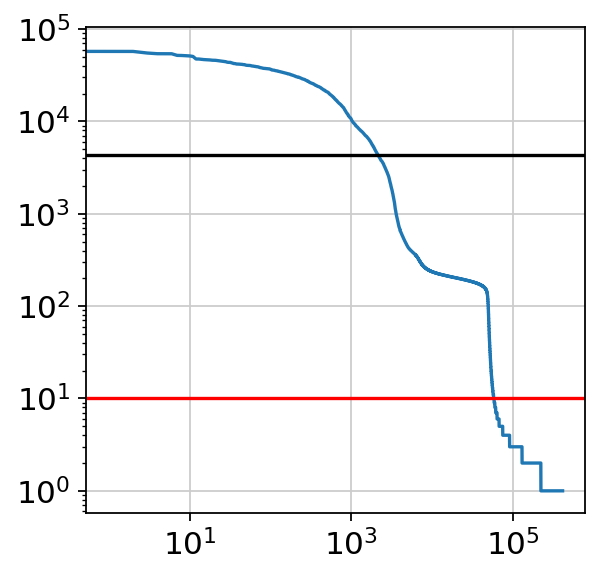

In [26]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [27]:
empty = D344_Biop_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [28]:
D344_Biop_Nas1 = D344_Biop_Nas1[qc_df_subsetFull.index.tolist()]
D344_Biop_Nas1.obs['background'] = back
D344_Biop_Nas1.obs['empty_droplets'] = empty.shape[0]

D344_Biop_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


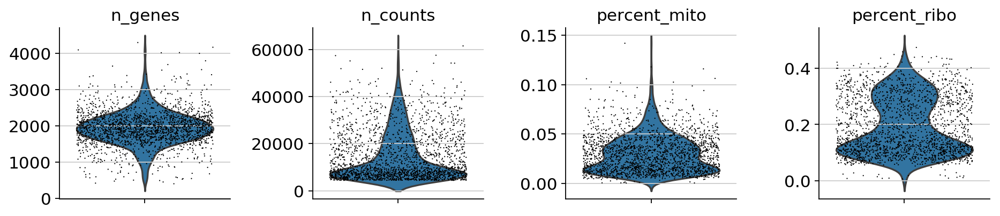

In [29]:
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=0)
mito_genes = D344_Biop_Nas1.var_names.str.startswith('MT-')
D344_Biop_Nas1.obs['percent_mito'] = np.sum(
    D344_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Nas1.X, axis=1).A1
D344_Biop_Nas1.obs['n_counts'] = D344_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Nas1.to_df())
ribo_genes = D344_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D344_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Nas1.X, axis=1).A1
D344_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [30]:
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=500)
D344_Biop_Nas1 = D344_Biop_Nas1[D344_Biop_Nas1.obs['n_counts'] < 50000, :]
D344_Biop_Nas1 = D344_Biop_Nas1[D344_Biop_Nas1.obs['percent_mito'] < 0.1, :]
sc.pp.normalize_per_cell(D344_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Nas1) # log transform the data
D344_Biop_Nas1.raw = D344_Biop_Nas1
D344_Biop_Nas1_raw = D344_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 6 cells that have less than 500 genes expressed


In [31]:
D344_Biop_Nas1 = D344_Biop_Nas1[:, D344_Biop_Nas1.var['ribo_genes']]
D344_Biop_Nas1

View of AnnData object with n_obs × n_vars = 2094 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [32]:
D345_Biop_Nas1 = sc.read_10x_mtx(
    './D345_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D345_Biop_Nas1.var_names_make_unique()
D345_Biop_Nas1.obs['manip'] = 'D345_Biop_Nas1'
D345_Biop_Nas1.obs['position'] = 'Nasal'
D345_Biop_Nas1.obs['method'] = 'Biopsy'
D345_Biop_Nas1.obs['donor'] = 'D345'
D345_Biop_Nas1.obs['name'] = ['D345_Biop_Nas1_' + s for s in list(D345_Biop_Nas1.obs.index)]
D345_Biop_Nas1.obs_names = D345_Biop_Nas1.obs['name']
D345_Biop_Nas1

filtered = sc.read_10x_mtx(
    './D345_Biop_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D345_Biop_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D345_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [33]:
D345_Biop_Nas1.obs['n_counts'] = D345_Biop_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=0)
D345_Biop_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [34]:
qc_df = D345_Biop_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(236105, 3)

(3257, 3)
(8113, 3)


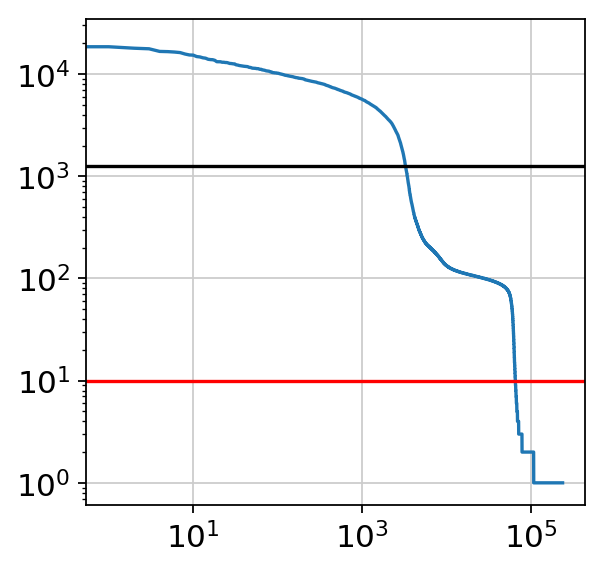

In [35]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [36]:
empty = D345_Biop_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [37]:
D345_Biop_Nas1 = D345_Biop_Nas1[qc_df_subsetFull.index.tolist()]
D345_Biop_Nas1.obs['background'] = back
D345_Biop_Nas1.obs['empty_droplets'] = empty.shape[0]

D345_Biop_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


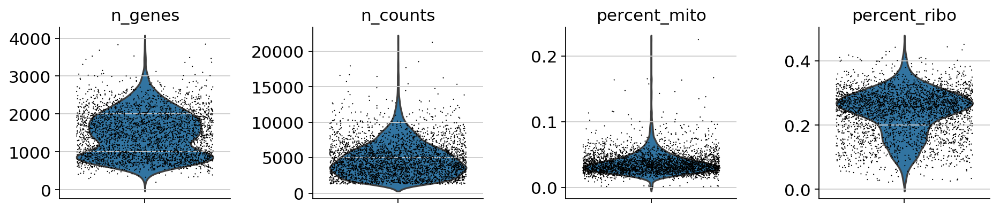

In [38]:
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=0)
mito_genes = D345_Biop_Nas1.var_names.str.startswith('MT-')
D345_Biop_Nas1.obs['percent_mito'] = np.sum(
    D345_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D345_Biop_Nas1.X, axis=1).A1
D345_Biop_Nas1.obs['n_counts'] = D345_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D345_Biop_Nas1.to_df())
ribo_genes = D345_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D345_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D345_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D345_Biop_Nas1.X, axis=1).A1
D345_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D345_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [39]:
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=500)
D345_Biop_Nas1 = D345_Biop_Nas1[D345_Biop_Nas1.obs['n_counts'] < 20000, :]
D345_Biop_Nas1 = D345_Biop_Nas1[D345_Biop_Nas1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D345_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D345_Biop_Nas1) # log transform the data
D345_Biop_Nas1.raw = D345_Biop_Nas1
D345_Biop_Nas1_raw = D345_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 32 cells that have less than 500 genes expressed


In [40]:
D345_Biop_Nas1 = D345_Biop_Nas1[:, D345_Biop_Nas1.var['ribo_genes']]
D345_Biop_Nas1

View of AnnData object with n_obs × n_vars = 3223 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

# Nasal Brushings
[Back to top](#Full-Aggregate)

In [41]:
D353_Brus_Nas1 = sc.read_10x_mtx(
    './D353_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Brus_Nas1.var_names_make_unique()
D353_Brus_Nas1.obs['manip'] = 'D353_Brus_Nas1'
D353_Brus_Nas1.obs['position'] = 'Nasal'
D353_Brus_Nas1.obs['method'] = 'Brushing'
D353_Brus_Nas1.obs['donor'] = 'D353'
D353_Brus_Nas1.obs['name'] = ['D353_Brus_Nas1_' + s for s in list(D353_Brus_Nas1.obs.index)]
D353_Brus_Nas1.obs_names = D353_Brus_Nas1.obs['name']
D353_Brus_Nas1

filtered = sc.read_10x_mtx(
    './D353_Brus_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D353_Brus_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D353_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [42]:
D353_Brus_Nas1.obs['n_counts'] = D353_Brus_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=0)
D353_Brus_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [43]:
qc_df = D353_Brus_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(411765, 3)

(5153, 3)
(20474, 3)


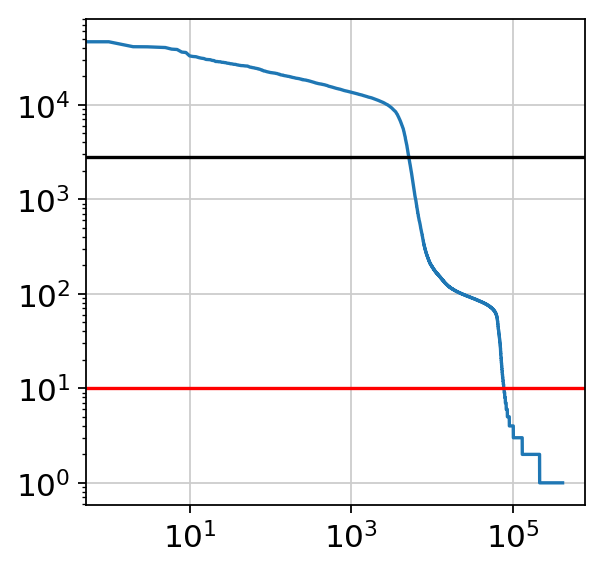

In [44]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [45]:
empty = D353_Brus_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [46]:
D353_Brus_Nas1 = D353_Brus_Nas1[qc_df_subsetFull.index.tolist()]
D353_Brus_Nas1.obs['background'] = back
D353_Brus_Nas1.obs['empty_droplets'] = empty.shape[0]

D353_Brus_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


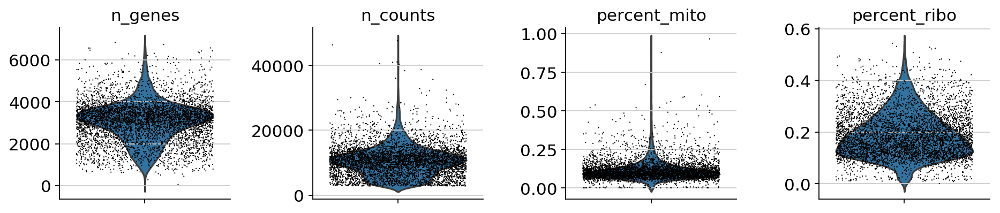

In [47]:
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=0)
mito_genes = D353_Brus_Nas1.var_names.str.startswith('MT-')
D353_Brus_Nas1.obs['percent_mito'] = np.sum(
    D353_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Brus_Nas1.X, axis=1).A1
D353_Brus_Nas1.obs['n_counts'] = D353_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Brus_Nas1.to_df())
ribo_genes = D353_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D353_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D353_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Brus_Nas1.X, axis=1).A1
D353_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [48]:
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=500)
D353_Brus_Nas1 = D353_Brus_Nas1[D353_Brus_Nas1.obs['n_counts'] < 40000, :]
D353_Brus_Nas1 = D353_Brus_Nas1[D353_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D353_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Brus_Nas1) # log transform the data
D353_Brus_Nas1.raw = D353_Brus_Nas1
D353_Brus_Nas1_raw = D353_Brus_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 3 cells that have less than 500 genes expressed


In [49]:
D353_Brus_Nas1 = D353_Brus_Nas1[:, D353_Brus_Nas1.var['ribo_genes']]
D353_Brus_Nas1

View of AnnData object with n_obs × n_vars = 5130 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [50]:
D363_Brus_Nas1 = sc.read_10x_mtx(
    './D363_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Brus_Nas1.var_names_make_unique()
D363_Brus_Nas1.obs['manip'] = 'D363_Brus_Nas1'
D363_Brus_Nas1.obs['position'] = 'Nasal'
D363_Brus_Nas1.obs['method'] = 'Brushing'
D363_Brus_Nas1.obs['donor'] = 'D363'
D363_Brus_Nas1.obs['name'] = ['D363_Brus_Nas1_' + s for s in list(D363_Brus_Nas1.obs.index)]
D363_Brus_Nas1.obs_names = D363_Brus_Nas1.obs['name']
D363_Brus_Nas1

filtered = sc.read_10x_mtx(
    './D363_Brus_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D363_Brus_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D363_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [51]:
D363_Brus_Nas1.obs['n_counts'] = D363_Brus_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=0)
D363_Brus_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [52]:
qc_df = D363_Brus_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(423488, 3)

(3503, 3)
(7121, 3)


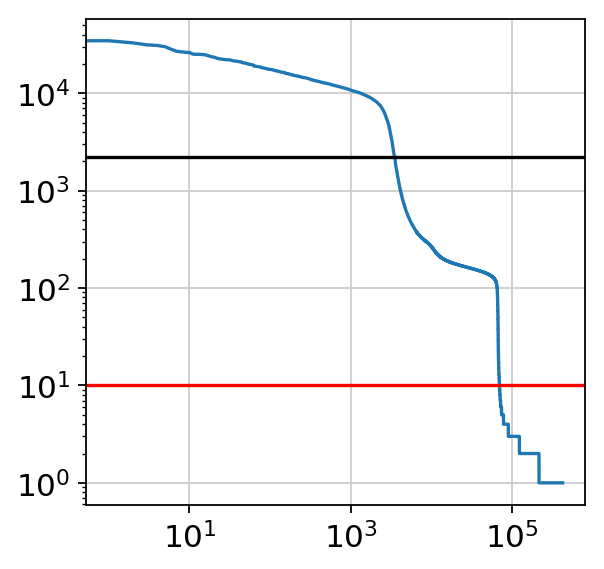

In [53]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [54]:
empty = D363_Brus_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [55]:
D363_Brus_Nas1 = D363_Brus_Nas1[qc_df_subsetFull.index.tolist()]
D363_Brus_Nas1.obs['background'] = back
D363_Brus_Nas1.obs['empty_droplets'] = empty.shape[0]

D363_Brus_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


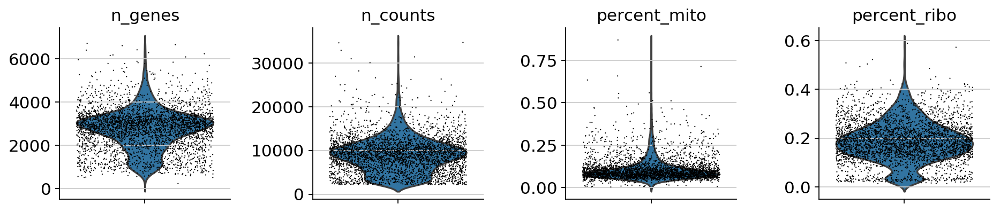

In [56]:
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=0)
mito_genes = D363_Brus_Nas1.var_names.str.startswith('MT-')
D363_Brus_Nas1.obs['percent_mito'] = np.sum(
    D363_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Brus_Nas1.X, axis=1).A1
D363_Brus_Nas1.obs['n_counts'] = D363_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Brus_Nas1.to_df())
ribo_genes = D363_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D363_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D363_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Brus_Nas1.X, axis=1).A1
D363_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [57]:
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=500)
D363_Brus_Nas1 = D363_Brus_Nas1[D363_Brus_Nas1.obs['n_counts'] < 30000, :]
D363_Brus_Nas1 = D363_Brus_Nas1[D363_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D363_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Brus_Nas1) # log transform the data
D363_Brus_Nas1.raw = D363_Brus_Nas1 
D363_Brus_Nas1_raw = D363_Brus_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 1 cells that have less than 500 genes expressed


In [58]:
D363_Brus_Nas1 = D363_Brus_Nas1[:, D363_Brus_Nas1.var['ribo_genes']]
D363_Brus_Nas1

View of AnnData object with n_obs × n_vars = 3488 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [59]:
D367_Brus_Nas1 = sc.read_10x_mtx(
    './D367_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Brus_Nas1.var_names_make_unique()
D367_Brus_Nas1.obs['manip'] = 'D367_Brus_Nas1'
D367_Brus_Nas1.obs['position'] = 'Nasal'
D367_Brus_Nas1.obs['method'] = 'Brushing'
D367_Brus_Nas1.obs['donor'] = 'D367'
D367_Brus_Nas1.obs['name'] = ['D367_Brus_Nas1_' + s for s in list(D367_Brus_Nas1.obs.index)]
D367_Brus_Nas1.obs_names = D367_Brus_Nas1.obs['name']
D367_Brus_Nas1

filtered = sc.read_10x_mtx(
    './D367_Brus_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D367_Brus_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D367_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [60]:
D367_Brus_Nas1.obs['n_counts'] = D367_Brus_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=0)
D367_Brus_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [61]:
qc_df = D367_Brus_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(390189, 3)

(2595, 3)
(3886, 3)


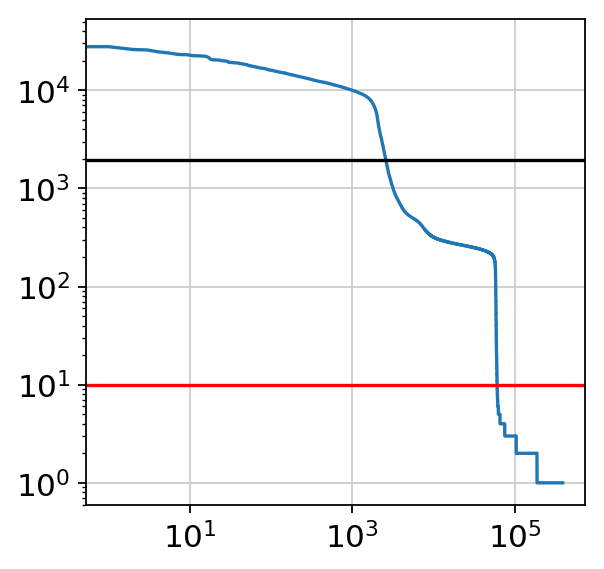

In [62]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [63]:
empty = D367_Brus_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [64]:
D367_Brus_Nas1 = D367_Brus_Nas1[qc_df_subsetFull.index.tolist()]
D367_Brus_Nas1.obs['background'] = back
D367_Brus_Nas1.obs['empty_droplets'] = empty.shape[0]

D367_Brus_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


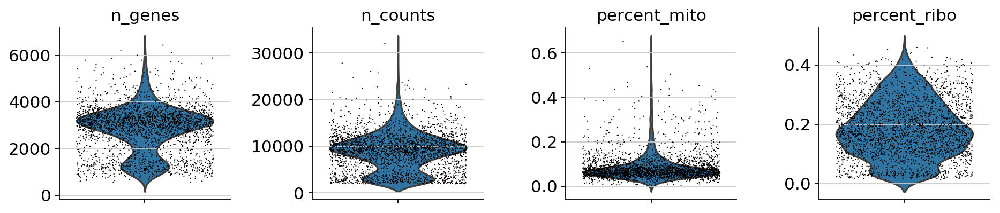

In [65]:
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=0)
mito_genes = D367_Brus_Nas1.var_names.str.startswith('MT-')
D367_Brus_Nas1.obs['percent_mito'] = np.sum(
    D367_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Brus_Nas1.X, axis=1).A1
D367_Brus_Nas1.obs['n_counts'] = D367_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Brus_Nas1.to_df())
ribo_genes = D367_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D367_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D367_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Brus_Nas1.X, axis=1).A1
D367_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [66]:
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=500)
D367_Brus_Nas1 = D367_Brus_Nas1[D367_Brus_Nas1.obs['n_counts'] < 30000, :]
D367_Brus_Nas1 = D367_Brus_Nas1[D367_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D367_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Brus_Nas1) # log transform the data
D367_Brus_Nas1.raw = D367_Brus_Nas1
D367_Brus_Nas1_raw = D367_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [67]:
D367_Brus_Nas1 = D367_Brus_Nas1[:, D367_Brus_Nas1.var['ribo_genes']]
D367_Brus_Nas1

View of AnnData object with n_obs × n_vars = 2590 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [68]:
D372_Brus_Nas1 = sc.read_10x_mtx(
    './D372_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Brus_Nas1.var_names_make_unique()
D372_Brus_Nas1.obs['manip'] = 'D372_Brus_Nas1'
D372_Brus_Nas1.obs['position'] = 'Nasal'
D372_Brus_Nas1.obs['method'] = 'Brushing'
D372_Brus_Nas1.obs['donor'] = 'D372'
D372_Brus_Nas1.obs['name'] = ['D372_Brus_Nas1_' + s for s in list(D372_Brus_Nas1.obs.index)]
D372_Brus_Nas1.obs_names = D372_Brus_Nas1.obs['name']
D372_Brus_Nas1

filtered = sc.read_10x_mtx(
    './D372_Brus_Nas1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D372_Brus_Nas1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D372_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [69]:
D372_Brus_Nas1.obs['n_counts'] = D372_Brus_Nas1.X.sum(axis=1).A1
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=0)
D372_Brus_Nas1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [70]:
qc_df = D372_Brus_Nas1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(370900, 3)

(2335, 3)
(9030, 3)


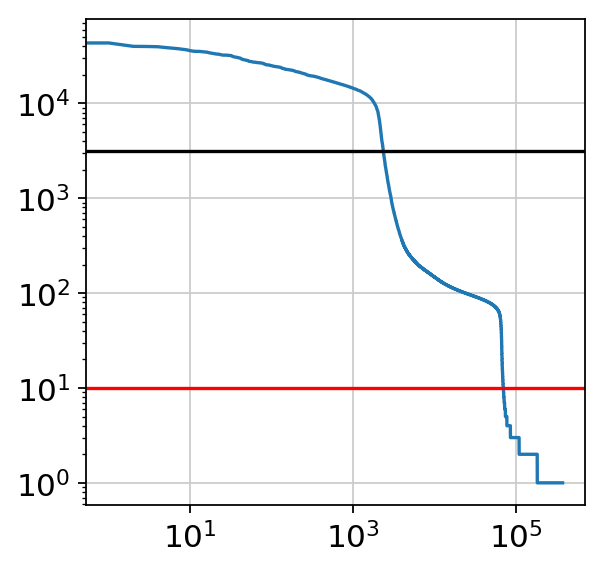

In [71]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [72]:
empty = D372_Brus_Nas1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [73]:
D372_Brus_Nas1 = D372_Brus_Nas1[qc_df_subsetFull.index.tolist()]
D372_Brus_Nas1.obs['background'] = back
D372_Brus_Nas1.obs['empty_droplets'] = empty.shape[0]

D372_Brus_Nas1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


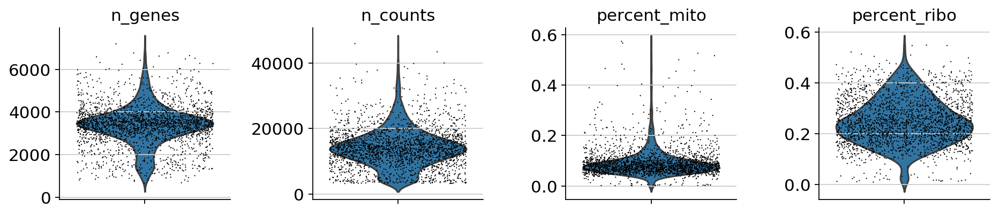

In [74]:
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=0)
mito_genes = D372_Brus_Nas1.var_names.str.startswith('MT-')
D372_Brus_Nas1.obs['percent_mito'] = np.sum(
    D372_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Brus_Nas1.X, axis=1).A1
D372_Brus_Nas1.obs['n_counts'] = D372_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Brus_Nas1.to_df())
ribo_genes = D372_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D372_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D372_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Brus_Nas1.X, axis=1).A1
D372_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [75]:
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=500)
D372_Brus_Nas1 = D372_Brus_Nas1[D372_Brus_Nas1.obs['n_counts'] < 40000, :]
D372_Brus_Nas1 = D372_Brus_Nas1[D372_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D372_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Brus_Nas1) # log transform the data
D372_Brus_Nas1.raw = D372_Brus_Nas1
D372_Brus_Nas1_raw = D372_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [76]:
D372_Brus_Nas1 = D372_Brus_Nas1[:, D372_Brus_Nas1.var['ribo_genes']]
D372_Brus_Nas1

View of AnnData object with n_obs × n_vars = 2328 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

# Proximal Biopsies
[Back to top](#Full-Aggregate)

In [77]:
D322_Biop_Pro1 = sc.read_10x_mtx(
    './D322_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Pro1.var_names_make_unique()
D322_Biop_Pro1.obs['manip'] = 'D322_Biop_Pro1'
D322_Biop_Pro1.obs['position'] = 'Proximal'
D322_Biop_Pro1.obs['method'] = 'Biopsy'
D322_Biop_Pro1.obs['donor'] = 'D322'
D322_Biop_Pro1.obs['name'] = ['D322_Biop_Pro1_' + s for s in list(D322_Biop_Pro1.obs.index)]
D322_Biop_Pro1.obs_names = D322_Biop_Pro1.obs['name']
D322_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D322_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D322_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D322_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [78]:
D322_Biop_Pro1.obs['n_counts'] = D322_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=0)
D322_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [79]:
qc_df = D322_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(274638, 3)

(2034, 3)
(16491, 3)


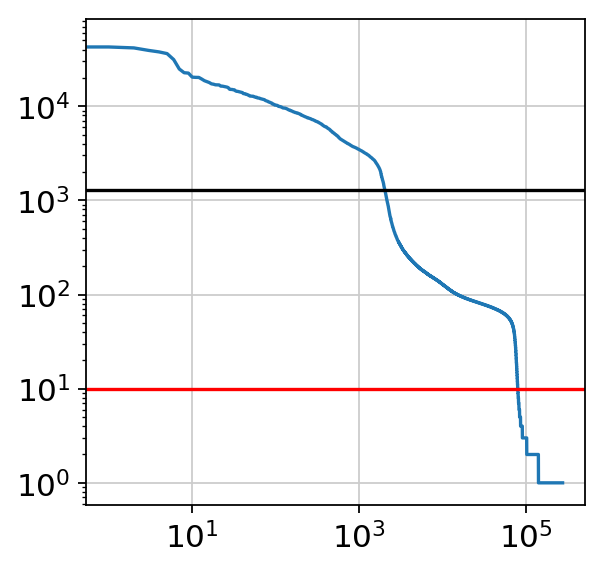

In [80]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [81]:
empty = D322_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [82]:
D322_Biop_Pro1 = D322_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D322_Biop_Pro1.obs['background'] = back
D322_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D322_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


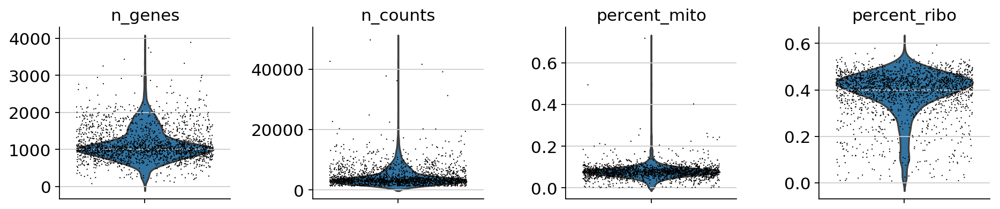

In [83]:
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=0)
mito_genes = D322_Biop_Pro1.var_names.str.startswith('MT-')
D322_Biop_Pro1.obs['percent_mito'] = np.sum(
    D322_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Pro1.X, axis=1).A1
D322_Biop_Pro1.obs['n_counts'] = D322_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Pro1.to_df())
ribo_genes = D322_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D322_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Pro1.X, axis=1).A1
D322_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [84]:
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=500)
D322_Biop_Pro1 = D322_Biop_Pro1[D322_Biop_Pro1.obs['n_counts'] < 20000, :]
D322_Biop_Pro1 = D322_Biop_Pro1[D322_Biop_Pro1.obs['percent_mito'] < 0.3, :]
sc.pp.normalize_per_cell(D322_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Pro1) # log transform the data
D322_Biop_Pro1.raw = D322_Biop_Pro1
D322_Biop_Pro1_raw = D322_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 59 cells that have less than 500 genes expressed


In [85]:
D322_Biop_Pro1 = D322_Biop_Pro1[:, D322_Biop_Pro1.var['ribo_genes']]
D322_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1962 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [86]:
D326_Biop_Pro1 = sc.read_10x_mtx(
    './D326_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Biop_Pro1.var_names_make_unique()
D326_Biop_Pro1.obs['manip'] = 'D326_Biop_Pro1'
D326_Biop_Pro1.obs['position'] = 'Proximal'
D326_Biop_Pro1.obs['method'] = 'Biopsy'
D326_Biop_Pro1.obs['donor'] = 'D326'
D326_Biop_Pro1.obs['name'] = ['D326_Biop_Pro1_' + s for s in list(D326_Biop_Pro1.obs.index)]
D326_Biop_Pro1.obs_names = D326_Biop_Pro1.obs['name']
D326_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D326_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D326_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D326_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [87]:
D326_Biop_Pro1.obs['n_counts'] = D326_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=0)
D326_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [88]:
qc_df = D326_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(394816, 3)

(2939, 3)
(14346, 3)


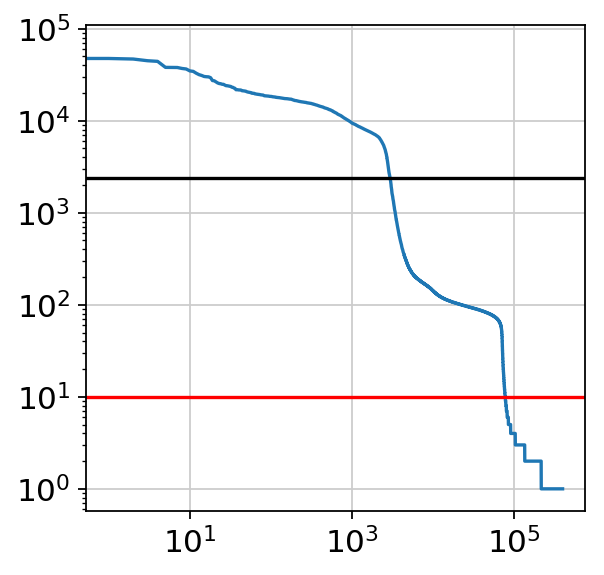

In [89]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [90]:
empty = D326_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [91]:
D326_Biop_Pro1 = D326_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D326_Biop_Pro1.obs['background'] = back
D326_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D326_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


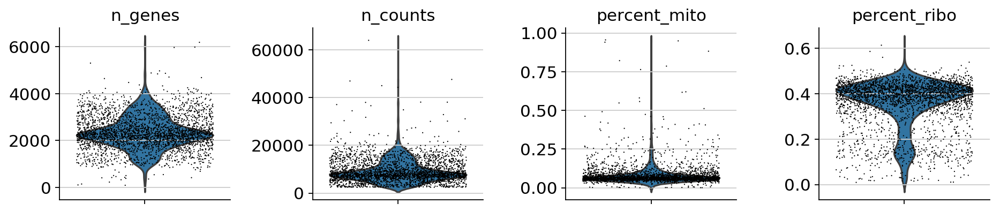

In [92]:
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=0)
mito_genes = D326_Biop_Pro1.var_names.str.startswith('MT-')
D326_Biop_Pro1.obs['percent_mito'] = np.sum(
    D326_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Biop_Pro1.X, axis=1).A1
D326_Biop_Pro1.obs['n_counts'] = D326_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Biop_Pro1.to_df())
ribo_genes = D326_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D326_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D326_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Biop_Pro1.X, axis=1).A1
D326_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [93]:
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=500)
D326_Biop_Pro1 = D326_Biop_Pro1[D326_Biop_Pro1.obs['n_counts'] < 40000, :]
D326_Biop_Pro1 = D326_Biop_Pro1[D326_Biop_Pro1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D326_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Biop_Pro1) # log transform the data
D326_Biop_Pro1.raw = D326_Biop_Pro1
D326_Biop_Pro1_raw = D326_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 12 cells that have less than 500 genes expressed


In [94]:
D326_Biop_Pro1 = D326_Biop_Pro1[:, D326_Biop_Pro1.var['ribo_genes']]
D326_Biop_Pro1

View of AnnData object with n_obs × n_vars = 2916 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [95]:
D339_Biop_Pro1 = sc.read_10x_mtx(
    './D339_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Pro1.var_names_make_unique()
D339_Biop_Pro1.obs['manip'] = 'D339_Biop_Pro1'
D339_Biop_Pro1.obs['position'] = 'Proximal'
D339_Biop_Pro1.obs['method'] = 'Biopsy'
D339_Biop_Pro1.obs['donor'] = 'D339'
D339_Biop_Pro1.obs['name'] = ['D339_Biop_Pro1_' + s for s in list(D339_Biop_Pro1.obs.index)]
D339_Biop_Pro1.obs_names = D339_Biop_Pro1.obs['name']
D339_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D339_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D339_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D339_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [96]:
D339_Biop_Pro1.obs['n_counts'] = D339_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=0)
D339_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [97]:
qc_df = D339_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(193460, 3)

(761, 3)
(61859, 3)


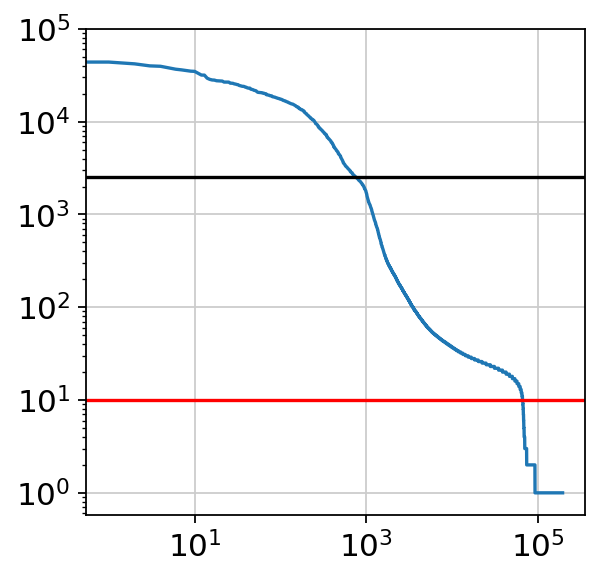

In [98]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [99]:
empty = D339_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [100]:
D339_Biop_Pro1 = D339_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D339_Biop_Pro1.obs['background'] = back
D339_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D339_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


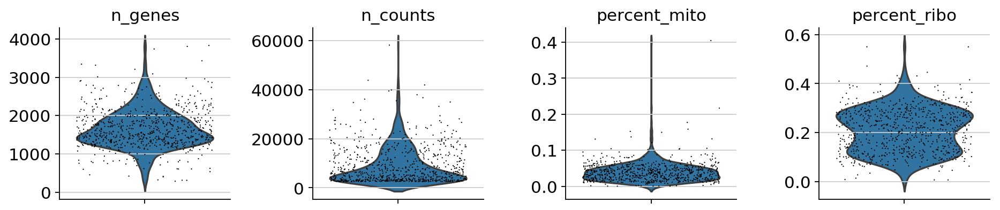

In [101]:
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=0)
mito_genes = D339_Biop_Pro1.var_names.str.startswith('MT-')
D339_Biop_Pro1.obs['percent_mito'] = np.sum(
    D339_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Pro1.X, axis=1).A1
D339_Biop_Pro1.obs['n_counts'] = D339_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Pro1.to_df())
ribo_genes = D339_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D339_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Pro1.X, axis=1).A1
D339_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [102]:
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=500)
D339_Biop_Pro1 = D339_Biop_Pro1[D339_Biop_Pro1.obs['n_counts'] < 40000, :]
D339_Biop_Pro1 = D339_Biop_Pro1[D339_Biop_Pro1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D339_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Pro1) # log transform the data
D339_Biop_Pro1.raw = D339_Biop_Pro1
D339_Biop_Pro1_raw = D339_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 8 cells that have less than 500 genes expressed


In [103]:
D339_Biop_Pro1 = D339_Biop_Pro1[:, D339_Biop_Pro1.var['ribo_genes']]
D339_Biop_Pro1

View of AnnData object with n_obs × n_vars = 748 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [104]:
D344_Biop_Pro1 = sc.read_10x_mtx(
    './D344_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Pro1.var_names_make_unique()
D344_Biop_Pro1.obs['manip'] = 'D344_Biop_Pro1'
D344_Biop_Pro1.obs['position'] = 'Proximal'
D344_Biop_Pro1.obs['method'] = 'Biopsy'
D344_Biop_Pro1.obs['donor'] = 'D344'
D344_Biop_Pro1.obs['name'] = ['D344_Biop_Pro1_' + s for s in list(D344_Biop_Pro1.obs.index)]
D344_Biop_Pro1.obs_names = D344_Biop_Pro1.obs['name']
D344_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D344_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D344_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D344_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [105]:
D344_Biop_Pro1.obs['n_counts'] = D344_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=0)
D344_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [106]:
qc_df = D344_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(109634, 3)

(312, 3)
(49853, 3)


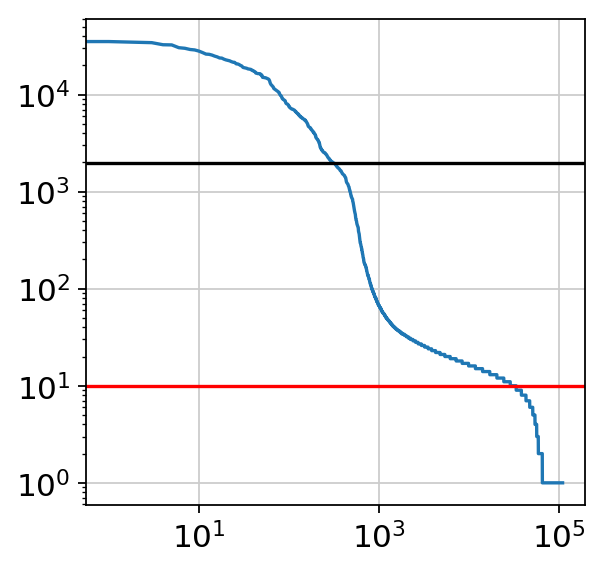

In [107]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [108]:
empty = D344_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [109]:
D344_Biop_Pro1 = D344_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D344_Biop_Pro1.obs['background'] = back
D344_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D344_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


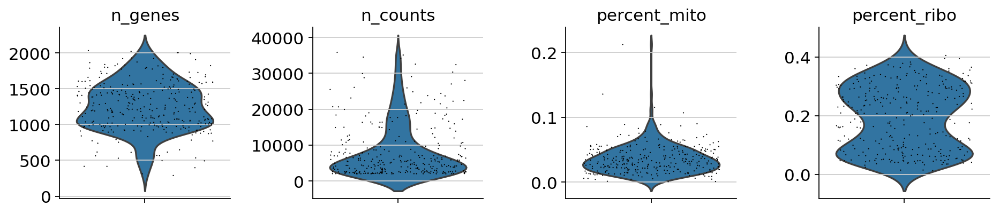

In [110]:
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=0)
mito_genes = D344_Biop_Pro1.var_names.str.startswith('MT-')
D344_Biop_Pro1.obs['percent_mito'] = np.sum(
    D344_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Pro1.X, axis=1).A1
D344_Biop_Pro1.obs['n_counts'] = D344_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Pro1.to_df())
ribo_genes = D344_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D344_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Pro1.X, axis=1).A1
D344_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [111]:
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=500)
D344_Biop_Pro1 = D344_Biop_Pro1[D344_Biop_Pro1.obs['n_counts'] < 40000, :]
D344_Biop_Pro1 = D344_Biop_Pro1[D344_Biop_Pro1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D344_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Pro1) # log transform the data
D344_Biop_Pro1.raw = D344_Biop_Pro1
D344_Biop_Pro1_raw = D344_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 7 cells that have less than 500 genes expressed


In [112]:
D344_Biop_Pro1 = D344_Biop_Pro1[:, D344_Biop_Pro1.var['ribo_genes']]
D344_Biop_Pro1

View of AnnData object with n_obs × n_vars = 304 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [113]:
D353_Biop_Pro1 = sc.read_10x_mtx(
    './D353_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Biop_Pro1.var_names_make_unique()
D353_Biop_Pro1.obs['manip'] = 'D353_Biop_Pro1'
D353_Biop_Pro1.obs['position'] = 'Proximal'
D353_Biop_Pro1.obs['method'] = 'Biopsy'
D353_Biop_Pro1.obs['donor'] = 'D353'
D353_Biop_Pro1.obs['name'] = ['D353_Biop_Pro1' + s for s in list(D353_Biop_Pro1.obs.index)]
D353_Biop_Pro1.obs_names = D353_Biop_Pro1.obs['name']
D353_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D353_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D353_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D353_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [114]:
D353_Biop_Pro1.obs['n_counts'] = D353_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=0)
D353_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [115]:
qc_df = D353_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(202847, 3)

(4231, 3)
(53378, 3)


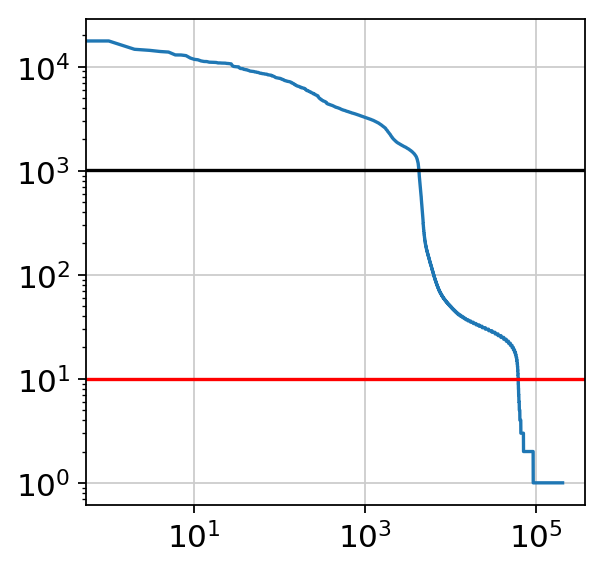

In [116]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [117]:
empty = D353_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [118]:
D353_Biop_Pro1 = D353_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D353_Biop_Pro1.obs['background'] = back
D353_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D353_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


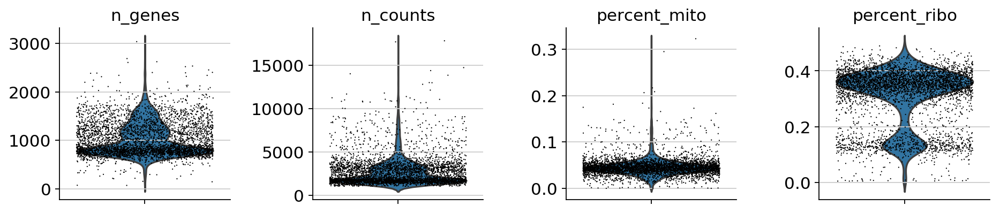

In [119]:
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=0)
mito_genes = D353_Biop_Pro1.var_names.str.startswith('MT-')
D353_Biop_Pro1.obs['percent_mito'] = np.sum(
    D353_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Biop_Pro1.X, axis=1).A1
D353_Biop_Pro1.obs['n_counts'] = D353_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Biop_Pro1.to_df())
ribo_genes = D353_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D353_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D353_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Biop_Pro1.X, axis=1).A1
D353_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [120]:
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=500)
D353_Biop_Pro1 = D353_Biop_Pro1[D353_Biop_Pro1.obs['n_counts'] < 15000, :]
D353_Biop_Pro1 = D353_Biop_Pro1[D353_Biop_Pro1.obs['percent_mito'] < 0.25, :]
sc.pp.normalize_per_cell(D353_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Biop_Pro1) # log transform the data
D353_Biop_Pro1.raw = D353_Biop_Pro1
D353_Biop_Pro1_raw = D353_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 41 cells that have less than 500 genes expressed


In [121]:
D353_Biop_Pro1 = D353_Biop_Pro1[:, D353_Biop_Pro1.var['ribo_genes']]
D353_Biop_Pro1

View of AnnData object with n_obs × n_vars = 4187 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [122]:
D354_Biop_Pro1 = sc.read_10x_mtx(
    './D354_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Biop_Pro1.var_names_make_unique()
D354_Biop_Pro1.obs['manip'] = 'D354_Biop_Pro1'
D354_Biop_Pro1.obs['position'] = 'Proximal'
D354_Biop_Pro1.obs['method'] = 'Biopsy'
D354_Biop_Pro1.obs['donor'] = 'D354'
D354_Biop_Pro1.obs['name'] = ['D354_Biop_Pro1_' + s for s in list(D354_Biop_Pro1.obs.index)]
D354_Biop_Pro1.obs_names = D354_Biop_Pro1.obs['name']
D354_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D354_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D354_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D354_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [123]:
D354_Biop_Pro1.obs['n_counts'] = D354_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=0)
D354_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [124]:
qc_df = D354_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(220209, 3)

(1876, 3)
(18192, 3)


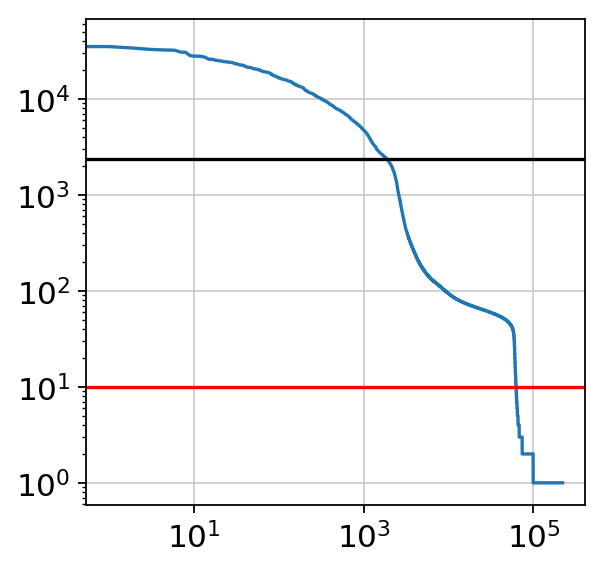

In [125]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [126]:
empty = D354_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [127]:
D354_Biop_Pro1 = D354_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D354_Biop_Pro1.obs['background'] = back
D354_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D354_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


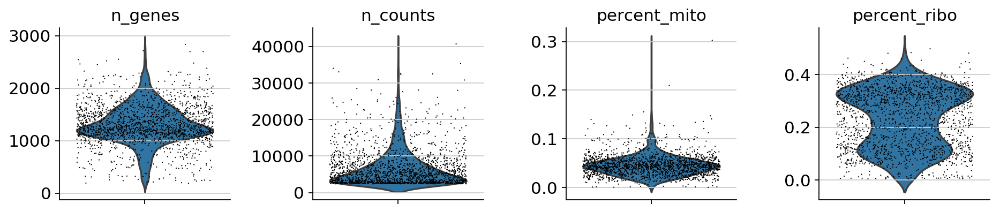

In [128]:
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=0)
mito_genes = D354_Biop_Pro1.var_names.str.startswith('MT-')
D354_Biop_Pro1.obs['percent_mito'] = np.sum(
    D354_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D354_Biop_Pro1.X, axis=1).A1
D354_Biop_Pro1.obs['n_counts'] = D354_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Biop_Pro1.to_df())
ribo_genes = D354_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D354_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D354_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Biop_Pro1.X, axis=1).A1
D354_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [129]:
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=500)
D354_Biop_Pro1 = D354_Biop_Pro1[D354_Biop_Pro1.obs['n_counts'] < 30000, :]
D354_Biop_Pro1 = D354_Biop_Pro1[D354_Biop_Pro1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D354_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Biop_Pro1) # log transform the data
D354_Biop_Pro1.raw = D354_Biop_Pro1
D354_Biop_Pro1_raw = D354_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 56 cells that have less than 500 genes expressed


In [130]:
D354_Biop_Pro1 = D354_Biop_Pro1[:, D354_Biop_Pro1.var['ribo_genes']]
D354_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1809 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [131]:
D363_Biop_Pro1 = sc.read_10x_mtx(
    './D363_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Biop_Pro1.var_names_make_unique()
D363_Biop_Pro1.obs['manip'] = 'D363_Biop_Pro1'
D363_Biop_Pro1.obs['position'] = 'Proximal'
D363_Biop_Pro1.obs['method'] = 'Biopsy'
D363_Biop_Pro1.obs['donor'] = 'D363'
D363_Biop_Pro1.obs['name'] = ['D363_Biop_Pro1_' + s for s in list(D363_Biop_Pro1.obs.index)]
D363_Biop_Pro1.obs_names = D363_Biop_Pro1.obs['name']
D363_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D363_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D363_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D363_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [132]:
D363_Biop_Pro1.obs['n_counts'] = D363_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=0)
D363_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [133]:
qc_df = D363_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(149414, 3)

(1530, 3)
(63824, 3)


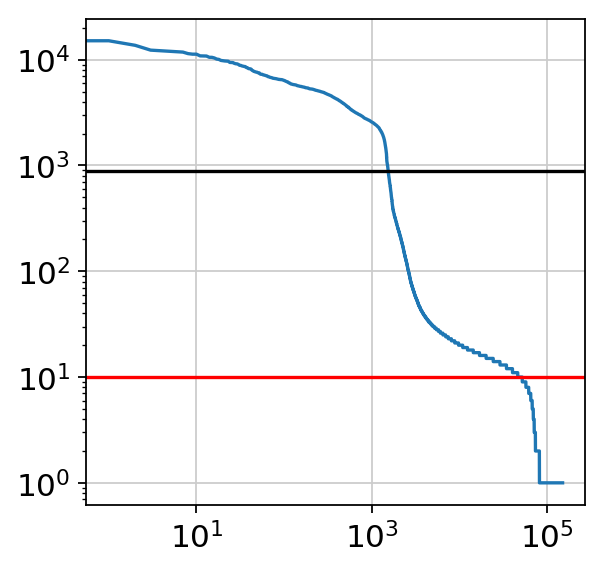

In [134]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [135]:
empty = D363_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [136]:
D363_Biop_Pro1 = D363_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D363_Biop_Pro1.obs['background'] = back
D363_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D363_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


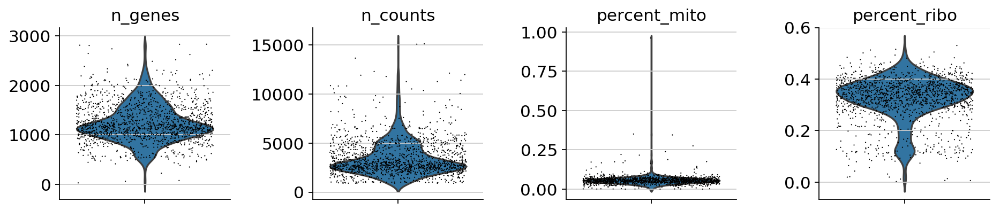

In [137]:
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=0)
mito_genes = D363_Biop_Pro1.var_names.str.startswith('MT-')
D363_Biop_Pro1.obs['percent_mito'] = np.sum(
    D363_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Biop_Pro1.X, axis=1).A1
D363_Biop_Pro1.obs['n_counts'] = D363_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Biop_Pro1.to_df())
ribo_genes = D363_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D363_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D363_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Biop_Pro1.X, axis=1).A1
D363_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [138]:
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=500)
D363_Biop_Pro1 = D363_Biop_Pro1[D363_Biop_Pro1.obs['n_counts'] < 15000, :]
D363_Biop_Pro1 = D363_Biop_Pro1[D363_Biop_Pro1.obs['percent_mito'] < 0.25, :]
sc.pp.normalize_per_cell(D363_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Biop_Pro1) # log transform the data
D363_Biop_Pro1.raw = D363_Biop_Pro1
D363_Biop_Pro1_raw = D363_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 19 cells that have less than 500 genes expressed


In [139]:
D363_Biop_Pro1 = D363_Biop_Pro1[:, D363_Biop_Pro1.var['ribo_genes']]
D363_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1508 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [140]:
D367_Biop_Pro1 = sc.read_10x_mtx(
    './D367_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Biop_Pro1.var_names_make_unique()
D367_Biop_Pro1.obs['manip'] = 'D367_Biop_Pro1'
D367_Biop_Pro1.obs['position'] = 'Proximal'
D367_Biop_Pro1.obs['method'] = 'Biopsy'
D367_Biop_Pro1.obs['donor'] = 'D367'
D367_Biop_Pro1.obs['name'] = ['D367_Biop_Pro1_' + s for s in list(D367_Biop_Pro1.obs.index)]
D367_Biop_Pro1.obs_names = D367_Biop_Pro1.obs['name']
D367_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D367_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D367_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D367_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [141]:
D367_Biop_Pro1.obs['n_counts'] = D367_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=0)
D367_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [142]:
qc_df = D367_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(319595, 3)

(3179, 3)
(2964, 3)


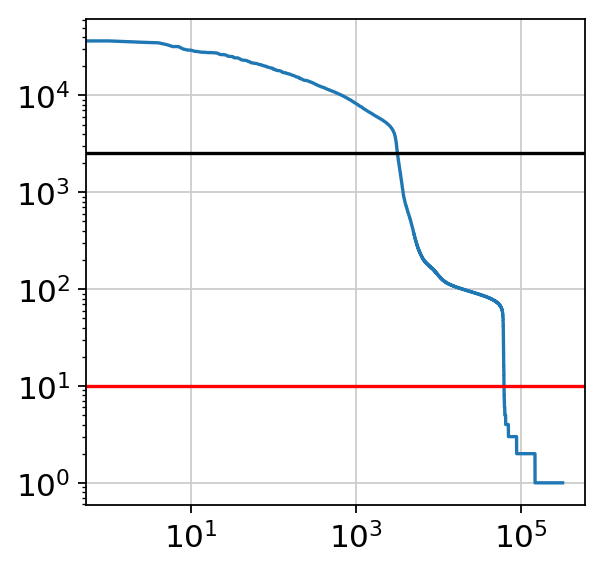

In [143]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [144]:
empty = D367_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [145]:
D367_Biop_Pro1 = D367_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D367_Biop_Pro1.obs['background'] = back
D367_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D367_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


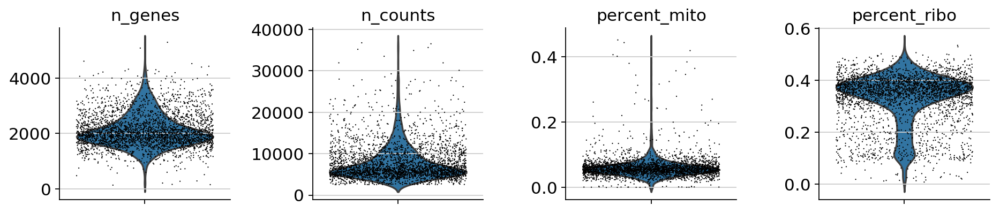

In [146]:
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=0)
mito_genes = D367_Biop_Pro1.var_names.str.startswith('MT-')
D367_Biop_Pro1.obs['percent_mito'] = np.sum(
    D367_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Biop_Pro1.X, axis=1).A1
D367_Biop_Pro1.obs['n_counts'] = D367_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Biop_Pro1.to_df())
ribo_genes = D367_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D367_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D367_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Biop_Pro1.X, axis=1).A1
D367_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [147]:
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=500)
D367_Biop_Pro1 = D367_Biop_Pro1[D367_Biop_Pro1.obs['n_counts'] < 30000, :]
D367_Biop_Pro1 = D367_Biop_Pro1[D367_Biop_Pro1.obs['percent_mito'] < 0.4, :]
sc.pp.normalize_per_cell(D367_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Biop_Pro1) # log transform the data
D367_Biop_Pro1.raw = D367_Biop_Pro1
D367_Biop_Pro1_raw = D367_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 7 cells that have less than 500 genes expressed


In [148]:
D367_Biop_Pro1 = D367_Biop_Pro1[:, D367_Biop_Pro1.var['ribo_genes']]
D367_Biop_Pro1

View of AnnData object with n_obs × n_vars = 3158 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [149]:
D372_Biop_Pro1 = sc.read_10x_mtx(
    './D372_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Pro1.var_names_make_unique()
D372_Biop_Pro1.obs['manip'] = 'D372_Biop_Pro1'
D372_Biop_Pro1.obs['position'] = 'Proximal'
D372_Biop_Pro1.obs['method'] = 'Biopsy'
D372_Biop_Pro1.obs['donor'] = 'D372'
D372_Biop_Pro1.obs['name'] = ['D372_Biop_Pro1_' + s for s in list(D372_Biop_Pro1.obs.index)]
D372_Biop_Pro1.obs_names = D372_Biop_Pro1.obs['name']
D372_Biop_Pro1

filtered = sc.read_10x_mtx(
    './D372_Biop_Pro1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D372_Biop_Pro1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D372_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [150]:
D372_Biop_Pro1.obs['n_counts'] = D372_Biop_Pro1.X.sum(axis=1).A1
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=0)
D372_Biop_Pro1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [151]:
qc_df = D372_Biop_Pro1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(364533, 3)

(4584, 3)
(12696, 3)


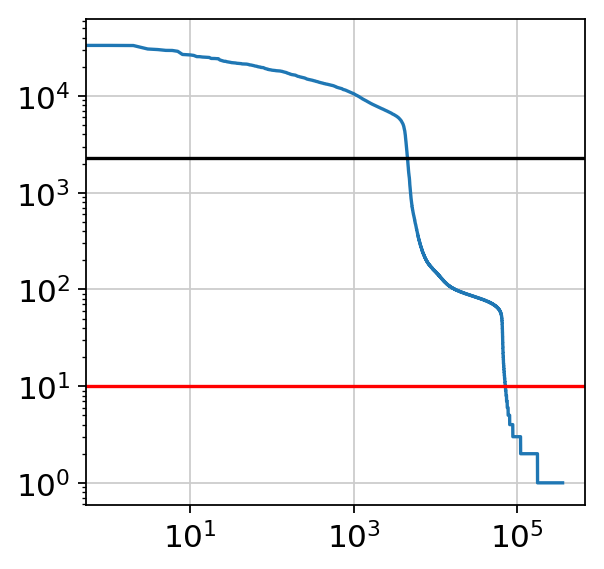

In [152]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [153]:
empty = D372_Biop_Pro1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [154]:
D372_Biop_Pro1 = D372_Biop_Pro1[qc_df_subsetFull.index.tolist()]
D372_Biop_Pro1.obs['background'] = back
D372_Biop_Pro1.obs['empty_droplets'] = empty.shape[0]

D372_Biop_Pro1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


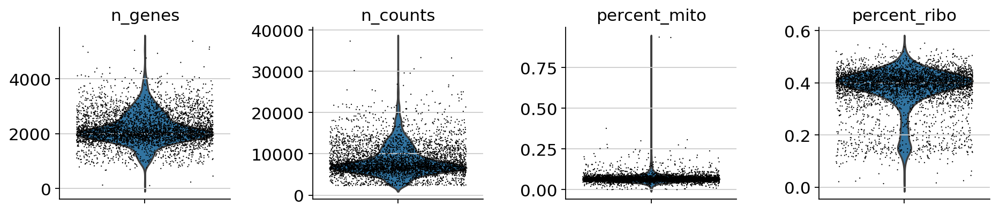

In [155]:
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=0)
mito_genes = D372_Biop_Pro1.var_names.str.startswith('MT-')
D372_Biop_Pro1.obs['percent_mito'] = np.sum(
    D372_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Pro1.X, axis=1).A1
D372_Biop_Pro1.obs['n_counts'] = D372_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Pro1.to_df())
ribo_genes = D372_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D372_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Pro1.X, axis=1).A1
D372_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [156]:
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=500)
D372_Biop_Pro1 = D372_Biop_Pro1[D372_Biop_Pro1.obs['n_counts'] < 30000, :]
D372_Biop_Pro1 = D372_Biop_Pro1[D372_Biop_Pro1.obs['percent_mito'] < 0.3, :]
sc.pp.normalize_per_cell(D372_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Pro1) # log transform the data
D372_Biop_Pro1.raw = D372_Biop_Pro1
D372_Biop_Pro1_raw = D372_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 4 cells that have less than 500 genes expressed


In [157]:
D372_Biop_Pro1 = D372_Biop_Pro1[:, D372_Biop_Pro1.var['ribo_genes']]
D372_Biop_Pro1

View of AnnData object with n_obs × n_vars = 4573 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

# Intermediate Biopsies
[Back to top](#Full-Aggregate)

In [158]:
D322_Biop_Int1 = sc.read_10x_mtx(
    './D322_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Int1.var_names_make_unique()
D322_Biop_Int1.obs['manip'] = 'D322_Biop_Int1'
D322_Biop_Int1.obs['position'] = 'Intermediate'
D322_Biop_Int1.obs['method'] = 'Biopsy'
D322_Biop_Int1.obs['donor'] = 'D322'
D322_Biop_Int1.obs['name'] = ['D322_Biop_Int1_' + s for s in list(D322_Biop_Int1.obs.index)]
D322_Biop_Int1.obs_names = D322_Biop_Int1.obs['name']
D322_Biop_Int1

filtered = sc.read_10x_mtx(
    './D322_Biop_Int1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D322_Biop_Int1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D322_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [159]:
D322_Biop_Int1.obs['n_counts'] = D322_Biop_Int1.X.sum(axis=1).A1
sc.pp.filter_cells(D322_Biop_Int1, min_genes=0)
D322_Biop_Int1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [160]:
qc_df = D322_Biop_Int1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(186328, 3)

(1922, 3)
(49297, 3)


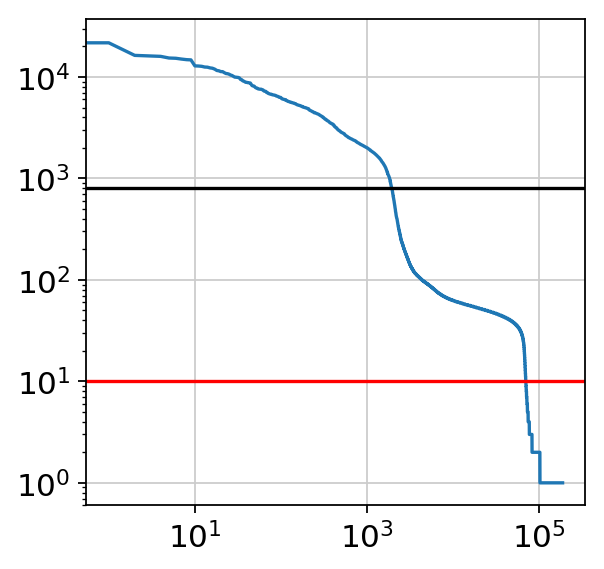

In [161]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [162]:
empty = D322_Biop_Int1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [163]:
D322_Biop_Int1 = D322_Biop_Int1[qc_df_subsetFull.index.tolist()]
D322_Biop_Int1.obs['background'] = back
D322_Biop_Int1.obs['empty_droplets'] = empty.shape[0]

D322_Biop_Int1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


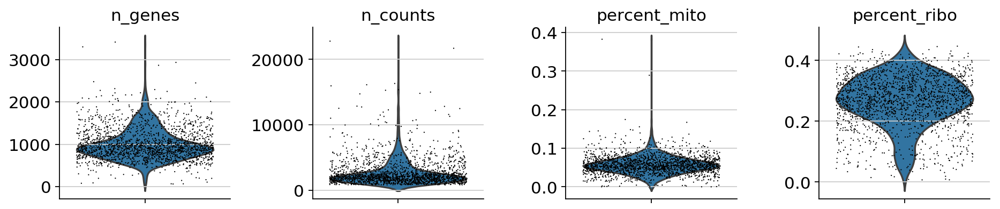

In [164]:
sc.pp.filter_cells(D322_Biop_Int1, min_genes=0)
mito_genes = D322_Biop_Int1.var_names.str.startswith('MT-')
D322_Biop_Int1.obs['percent_mito'] = np.sum(
    D322_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Int1.X, axis=1).A1
D322_Biop_Int1.obs['n_counts'] = D322_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Int1.to_df())
ribo_genes = D322_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Int1.obs['percent_ribo'] = np.sum(
    D322_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Int1.X, axis=1).A1
D322_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [165]:
sc.pp.filter_cells(D322_Biop_Int1, min_genes=500)
D322_Biop_Int1 = D322_Biop_Int1[D322_Biop_Int1.obs['n_counts'] < 20000, :]
D322_Biop_Int1 = D322_Biop_Int1[D322_Biop_Int1.obs['percent_mito'] < 0.2 , :]
sc.pp.normalize_per_cell(D322_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Int1) # log transform the data
D322_Biop_Int1.raw = D322_Biop_Int1
D322_Biop_Int1_raw = D322_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 63 cells that have less than 500 genes expressed


In [166]:
D322_Biop_Int1 = D322_Biop_Int1[:, D322_Biop_Int1.var['ribo_genes']]
D322_Biop_Int1

View of AnnData object with n_obs × n_vars = 1857 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [167]:
D326_Biop_Int1 = sc.read_10x_mtx(
    './D326_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Biop_Int1.var_names_make_unique()
D326_Biop_Int1.obs['manip'] = 'D326_Biop_Int1'
D326_Biop_Int1.obs['position'] = 'Intermediate'
D326_Biop_Int1.obs['method'] = 'Biopsy'
D326_Biop_Int1.obs['donor'] = 'D326'
D326_Biop_Int1.obs['name'] = ['D326_Biop_Int1_' + s for s in list(D326_Biop_Int1.obs.index)]
D326_Biop_Int1.obs_names = D326_Biop_Int1.obs['name']
D326_Biop_Int1

filtered = sc.read_10x_mtx(
    './D326_Biop_Int1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D326_Biop_Int1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D326_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [168]:
D326_Biop_Int1.obs['n_counts'] = D326_Biop_Int1.X.sum(axis=1).A1
sc.pp.filter_cells(D326_Biop_Int1, min_genes=0)
D326_Biop_Int1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [169]:
qc_df = D326_Biop_Int1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(207063, 3)

(1247, 3)
(90210, 3)


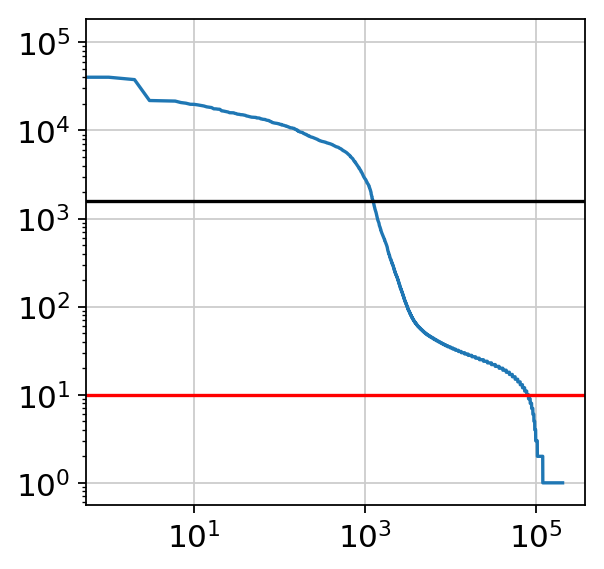

In [170]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [171]:
empty = D326_Biop_Int1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [172]:
D326_Biop_Int1 = D326_Biop_Int1[qc_df_subsetFull.index.tolist()]
D326_Biop_Int1.obs['background'] = back
D326_Biop_Int1.obs['empty_droplets'] = empty.shape[0]

D326_Biop_Int1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


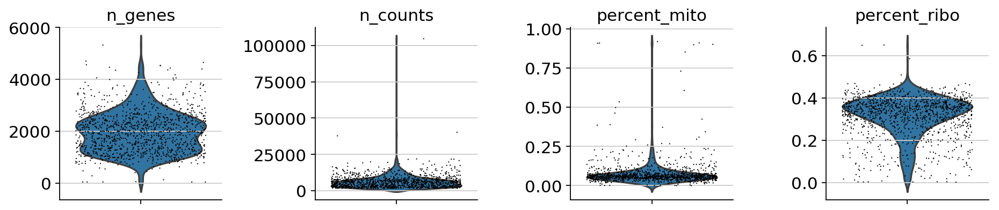

In [173]:
sc.pp.filter_cells(D326_Biop_Int1, min_genes=0)
mito_genes = D326_Biop_Int1.var_names.str.startswith('MT-')
D326_Biop_Int1.obs['percent_mito'] = np.sum(
    D326_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Biop_Int1.X, axis=1).A1
D326_Biop_Int1.obs['n_counts'] = D326_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Biop_Int1.to_df())
ribo_genes = D326_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D326_Biop_Int1.obs['percent_ribo'] = np.sum(
    D326_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Biop_Int1.X, axis=1).A1
D326_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [174]:
sc.pp.filter_cells(D326_Biop_Int1, min_genes=500)
D326_Biop_Int1 = D326_Biop_Int1[D326_Biop_Int1.obs['n_counts'] < 25000, :]
D326_Biop_Int1 = D326_Biop_Int1[D326_Biop_Int1.obs['percent_mito'] < 0.3, :]
sc.pp.normalize_per_cell(D326_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Biop_Int1) # log transform the data
D326_Biop_Int1.raw = D326_Biop_Int1
D326_Biop_Int1_raw = D326_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 11 cells that have less than 500 genes expressed


In [175]:
D326_Biop_Int1 = D326_Biop_Int1[:, D326_Biop_Int1.var['ribo_genes']]
D326_Biop_Int1

View of AnnData object with n_obs × n_vars = 1225 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [176]:
D339_Biop_Int1 = sc.read_10x_mtx(
    './D339_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Int1.var_names_make_unique()
D339_Biop_Int1.obs['manip'] = 'D339_Biop_Int1'
D339_Biop_Int1.obs['position'] = 'Intermediate'
D339_Biop_Int1.obs['method'] = 'Biopsy'
D339_Biop_Int1.obs['donor'] = 'D339'
D339_Biop_Int1.obs['name'] = ['D339_Biop_Int1_' + s for s in list(D339_Biop_Int1.obs.index)]
D339_Biop_Int1.obs_names = D339_Biop_Int1.obs['name']
D339_Biop_Int1

filtered = sc.read_10x_mtx(
    './D339_Biop_Int1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D339_Biop_Int1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D339_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [177]:
D339_Biop_Int1.obs['n_counts'] = D339_Biop_Int1.X.sum(axis=1).A1
sc.pp.filter_cells(D339_Biop_Int1, min_genes=0)
D339_Biop_Int1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [178]:
qc_df = D339_Biop_Int1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(281282, 3)

(3347, 3)
(60256, 3)


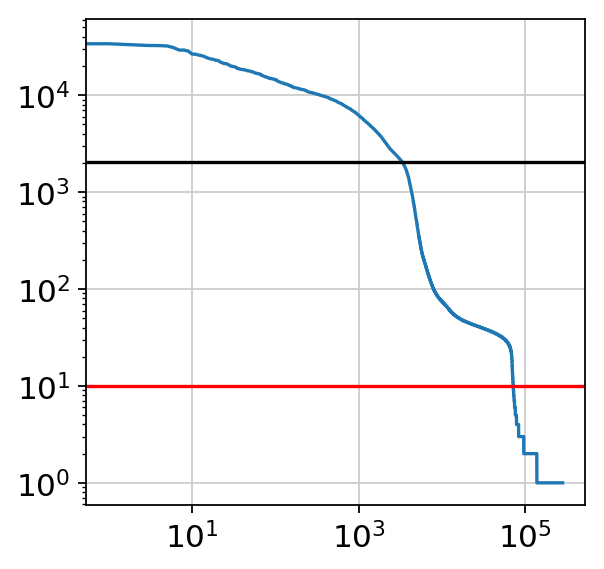

In [179]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [180]:
empty = D339_Biop_Int1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [181]:
D339_Biop_Int1 = D339_Biop_Int1[qc_df_subsetFull.index.tolist()]
D339_Biop_Int1.obs['background'] = back
D339_Biop_Int1.obs['empty_droplets'] = empty.shape[0]

D339_Biop_Int1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


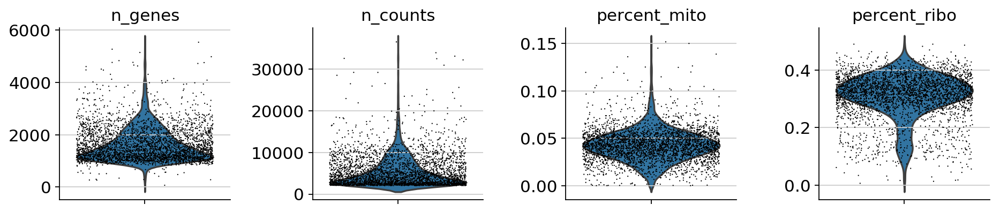

In [182]:
sc.pp.filter_cells(D339_Biop_Int1, min_genes=0)
mito_genes = D339_Biop_Int1.var_names.str.startswith('MT-')
D339_Biop_Int1.obs['percent_mito'] = np.sum(
    D339_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Int1.X, axis=1).A1
D339_Biop_Int1.obs['n_counts'] = D339_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Int1.to_df())
ribo_genes = D339_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Int1.obs['percent_ribo'] = np.sum(
    D339_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Int1.X, axis=1).A1
D339_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [183]:
sc.pp.filter_cells(D339_Biop_Int1, min_genes=500)
D339_Biop_Int1 = D339_Biop_Int1[D339_Biop_Int1.obs['n_counts'] < 30000, :]
D339_Biop_Int1 = D339_Biop_Int1[D339_Biop_Int1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D339_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Int1) # log transform the data
D339_Biop_Int1.raw = D339_Biop_Int1
D339_Biop_Int1_raw = D339_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 9 cells that have less than 500 genes expressed


In [184]:
D339_Biop_Int1 = D339_Biop_Int1[:, D339_Biop_Int1.var['ribo_genes']]
D339_Biop_Int1

View of AnnData object with n_obs × n_vars = 3329 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [185]:
D344_Biop_Int1 = sc.read_10x_mtx(
    './D344_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Int1.var_names_make_unique()
D344_Biop_Int1.obs['manip'] = 'D344_Biop_Int1'
D344_Biop_Int1.obs['position'] = 'Intermediate'
D344_Biop_Int1.obs['method'] = 'Biopsy'
D344_Biop_Int1.obs['donor'] = 'D344'
D344_Biop_Int1.obs['name'] = ['D344_Biop_Int1_' + s for s in list(D344_Biop_Int1.obs.index)]
D344_Biop_Int1.obs_names = D344_Biop_Int1.obs['name']
D344_Biop_Int1

filtered = sc.read_10x_mtx(
    './D344_Biop_Int1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D344_Biop_Int1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D344_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [186]:
D344_Biop_Int1.obs['n_counts'] = D344_Biop_Int1.X.sum(axis=1).A1
sc.pp.filter_cells(D344_Biop_Int1, min_genes=0)
D344_Biop_Int1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [187]:
qc_df = D344_Biop_Int1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(112232, 3)

(1049, 3)
(56378, 3)


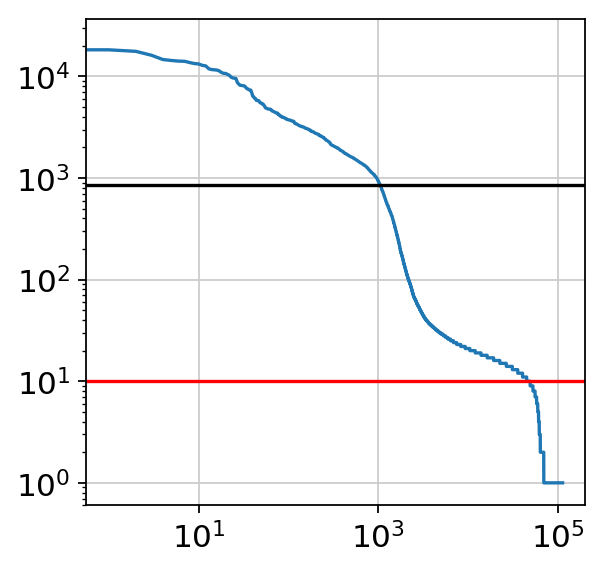

In [188]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [189]:
empty = D344_Biop_Int1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [190]:
D344_Biop_Int1 = D344_Biop_Int1[qc_df_subsetFull.index.tolist()]
D344_Biop_Int1.obs['background'] = back
D344_Biop_Int1.obs['empty_droplets'] = empty.shape[0]

D344_Biop_Int1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


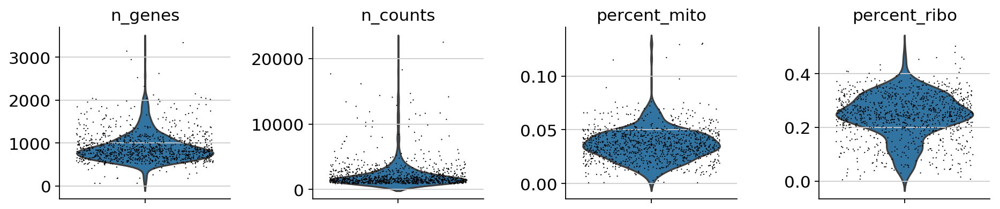

In [191]:
sc.pp.filter_cells(D344_Biop_Int1, min_genes=0)
mito_genes = D344_Biop_Int1.var_names.str.startswith('MT-')
D344_Biop_Int1.obs['percent_mito'] = np.sum(
    D344_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Int1.X, axis=1).A1
D344_Biop_Int1.obs['n_counts'] = D344_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Int1.to_df())
ribo_genes = D344_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Int1.obs['percent_ribo'] = np.sum(
    D344_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Int1.X, axis=1).A1
D344_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [192]:
sc.pp.filter_cells(D344_Biop_Int1, min_genes=500)
D344_Biop_Int1 = D344_Biop_Int1[D344_Biop_Int1.obs['n_counts'] < 10000, :]
D344_Biop_Int1 = D344_Biop_Int1[D344_Biop_Int1.obs['percent_mito'] < 0.1, :]
sc.pp.normalize_per_cell(D344_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Int1) # log transform the data
D344_Biop_Int1.raw = D344_Biop_Int1
D344_Biop_Int1_raw = D344_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 26 cells that have less than 500 genes expressed


In [193]:
D344_Biop_Int1 = D344_Biop_Int1[:, D344_Biop_Int1.var['ribo_genes']]
D344_Biop_Int1

View of AnnData object with n_obs × n_vars = 999 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [194]:
D353_Biop_Int2 = sc.read_10x_mtx(
    './D353_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Biop_Int2.var_names_make_unique()
D353_Biop_Int2.obs['manip'] = 'D353_Biop_Int2'
D353_Biop_Int2.obs['position'] = 'Intermediate'
D353_Biop_Int2.obs['method'] = 'Biopsy'
D353_Biop_Int2.obs['donor'] = 'D353'
D353_Biop_Int2.obs['name'] = ['D353_Biop_Int2_' + s for s in list(D353_Biop_Int2.obs.index)]
D353_Biop_Int2.obs_names = D353_Biop_Int2.obs['name']
D353_Biop_Int2

filtered = sc.read_10x_mtx(
    './D353_Biop_Int2/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D353_Biop_Int2-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D353_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [195]:
D353_Biop_Int2.obs['n_counts'] = D353_Biop_Int2.X.sum(axis=1).A1
sc.pp.filter_cells(D353_Biop_Int2, min_genes=0)
D353_Biop_Int2.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [196]:
qc_df = D353_Biop_Int2.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(146190, 3)

(2290, 3)
(62442, 3)


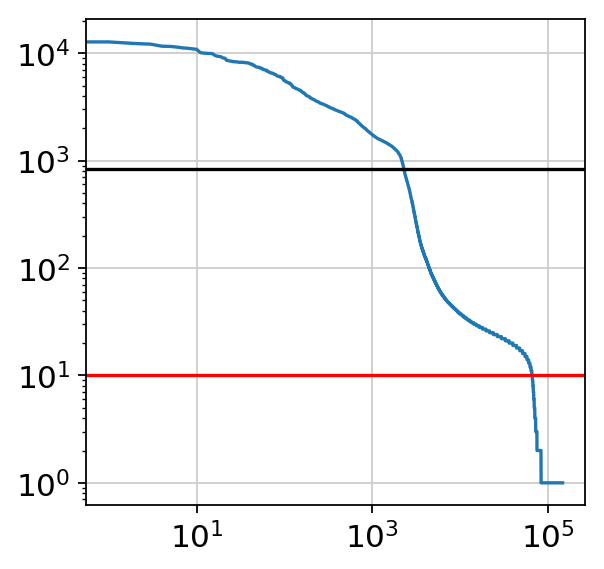

In [197]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [198]:
empty = D353_Biop_Int2[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [199]:
D353_Biop_Int2 = D353_Biop_Int2[qc_df_subsetFull.index.tolist()]
D353_Biop_Int2.obs['background'] = back
D353_Biop_Int2.obs['empty_droplets'] = empty.shape[0]

D353_Biop_Int2.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


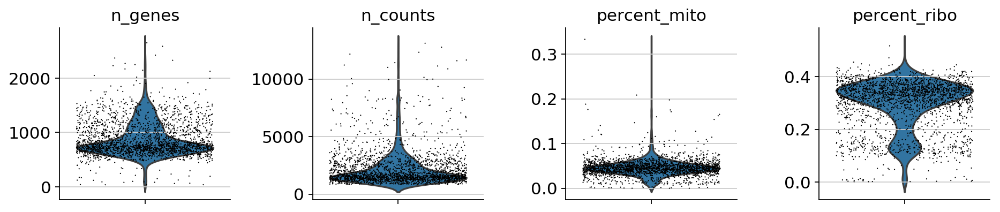

In [200]:
sc.pp.filter_cells(D353_Biop_Int2, min_genes=0)
mito_genes = D353_Biop_Int2.var_names.str.startswith('MT-')
D353_Biop_Int2.obs['percent_mito'] = np.sum(
    D353_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D353_Biop_Int2.X, axis=1).A1
D353_Biop_Int2.obs['n_counts'] = D353_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Biop_Int2.to_df())
ribo_genes = D353_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D353_Biop_Int2.obs['percent_ribo'] = np.sum(
    D353_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Biop_Int2.X, axis=1).A1
D353_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [201]:
sc.pp.filter_cells(D353_Biop_Int2, min_genes=500)
D353_Biop_Int2 = D353_Biop_Int2[D353_Biop_Int2.obs['n_counts'] < 10000, :]
D353_Biop_Int2 = D353_Biop_Int2[D353_Biop_Int2.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D353_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Biop_Int2) # log transform the data
D353_Biop_Int2.raw = D353_Biop_Int2
D353_Biop_Int2_raw = D353_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 71 cells that have less than 500 genes expressed


In [202]:
D353_Biop_Int2 = D353_Biop_Int2[:, D353_Biop_Int2.var['ribo_genes']]
D353_Biop_Int2

View of AnnData object with n_obs × n_vars = 2196 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [203]:
D354_Biop_Int2 = sc.read_10x_mtx(
    './D354_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Biop_Int2.var_names_make_unique()
D354_Biop_Int2.obs['manip'] = 'D354_Biop_Int2'
D354_Biop_Int2.obs['position'] = 'Intermediate'
D354_Biop_Int2.obs['method'] = 'Biopsy'
D354_Biop_Int2.obs['donor'] = 'D354'
D354_Biop_Int2.obs['name'] = ['D354_Biop_Int2_' + s for s in list(D354_Biop_Int2.obs.index)]
D354_Biop_Int2.obs_names = D354_Biop_Int2.obs['name']
D354_Biop_Int2

filtered = sc.read_10x_mtx(
    './D354_Biop_Int2/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D354_Biop_Int2-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D354_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [204]:
D354_Biop_Int2.obs['n_counts'] = D354_Biop_Int2.X.sum(axis=1).A1
sc.pp.filter_cells(D354_Biop_Int2, min_genes=0)
D354_Biop_Int2.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [205]:
qc_df = D354_Biop_Int2.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(219437, 3)

(2774, 3)
(6458, 3)


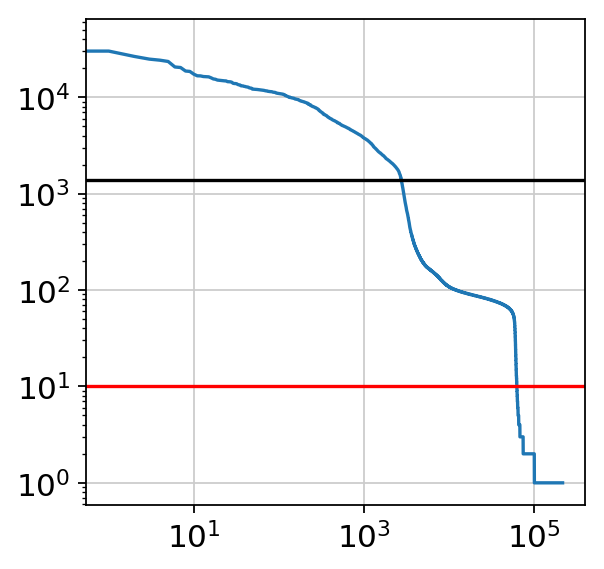

In [206]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [207]:
empty = D354_Biop_Int2[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [208]:
D354_Biop_Int2 = D354_Biop_Int2[qc_df_subsetFull.index.tolist()]
D354_Biop_Int2.obs['background'] = back
D354_Biop_Int2.obs['empty_droplets'] = empty.shape[0]

D354_Biop_Int2.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


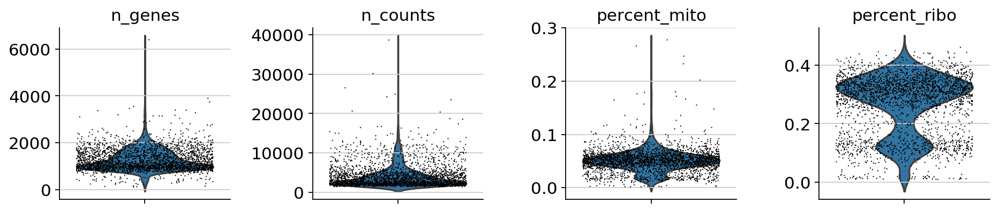

In [209]:
sc.pp.filter_cells(D354_Biop_Int2, min_genes=0)
mito_genes = D354_Biop_Int2.var_names.str.startswith('MT-')
D354_Biop_Int2.obs['percent_mito'] = np.sum(
    D354_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D354_Biop_Int2.X, axis=1).A1
D354_Biop_Int2.obs['n_counts'] = D354_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Biop_Int2.to_df())
ribo_genes = D354_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D354_Biop_Int2.obs['percent_ribo'] = np.sum(
    D354_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Biop_Int2.X, axis=1).A1
D354_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [210]:
sc.pp.filter_cells(D354_Biop_Int2, min_genes=500)
D354_Biop_Int2 = D354_Biop_Int2[D354_Biop_Int2.obs['n_counts'] < 20000, :]
D354_Biop_Int2 = D354_Biop_Int2[D354_Biop_Int2.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D354_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Biop_Int2) # log transform the data
D354_Biop_Int2.raw = D354_Biop_Int2 
D354_Biop_Int2_raw = D354_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 51 cells that have less than 500 genes expressed


In [211]:
D354_Biop_Int2 = D354_Biop_Int2[:, D354_Biop_Int2.var['ribo_genes']]
D354_Biop_Int2

View of AnnData object with n_obs × n_vars = 2710 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [212]:
D363_Biop_Int2 = sc.read_10x_mtx(
    './D363_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Biop_Int2.var_names_make_unique()
D363_Biop_Int2.obs['manip'] = 'D363_Biop_Int2'
D363_Biop_Int2.obs['position'] = 'Intermediate'
D363_Biop_Int2.obs['method'] = 'Biopsy'
D363_Biop_Int2.obs['donor'] = 'D363'
D363_Biop_Int2.obs['name'] = ['D363_Biop_Int2_' + s for s in list(D363_Biop_Int2.obs.index)]
D363_Biop_Int2.obs_names = D363_Biop_Int2.obs['name']
D363_Biop_Int2

filtered = sc.read_10x_mtx(
    './D363_Biop_Int2/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D363_Biop_Int2-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D363_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [213]:
D363_Biop_Int2.obs['n_counts'] = D363_Biop_Int2.X.sum(axis=1).A1
sc.pp.filter_cells(D363_Biop_Int2, min_genes=0)
D363_Biop_Int2.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [214]:
qc_df = D363_Biop_Int2.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(147269, 3)

(1289, 3)
(64103, 3)


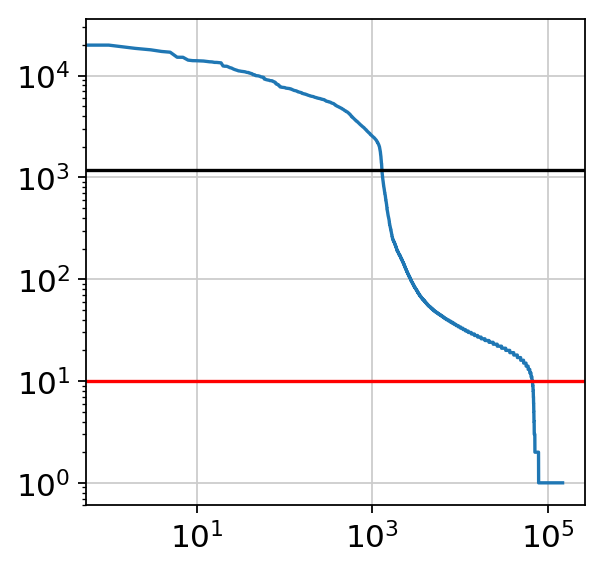

In [215]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [216]:
empty = D363_Biop_Int2[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [217]:
D363_Biop_Int2 = D363_Biop_Int2[qc_df_subsetFull.index.tolist()]
D363_Biop_Int2.obs['background'] = back
D363_Biop_Int2.obs['empty_droplets'] = empty.shape[0]

D363_Biop_Int2.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


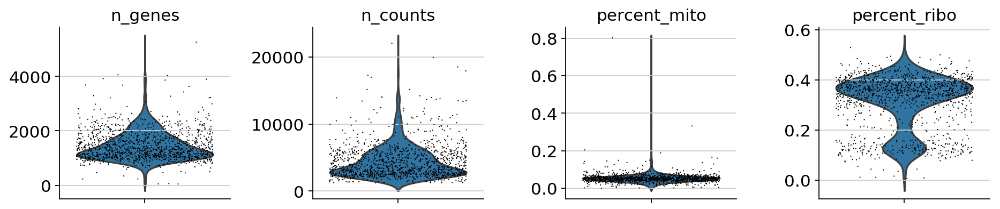

In [218]:
sc.pp.filter_cells(D363_Biop_Int2, min_genes=0)
mito_genes = D363_Biop_Int2.var_names.str.startswith('MT-')
D363_Biop_Int2.obs['percent_mito'] = np.sum(
    D363_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D363_Biop_Int2.X, axis=1).A1
D363_Biop_Int2.obs['n_counts'] = D363_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Biop_Int2.to_df())
ribo_genes = D363_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D363_Biop_Int2.obs['percent_ribo'] = np.sum(
    D363_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Biop_Int2.X, axis=1).A1
D363_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [219]:
sc.pp.filter_cells(D363_Biop_Int2, min_genes=500)
D363_Biop_Int2 = D363_Biop_Int2[D363_Biop_Int2.obs['n_counts'] < 15000, :]
D363_Biop_Int2 = D363_Biop_Int2[D363_Biop_Int2.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D363_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Biop_Int2) # log transform the data
D363_Biop_Int2.raw = D363_Biop_Int2
D363_Biop_Int2_raw = D363_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 10 cells that have less than 500 genes expressed


In [220]:
D363_Biop_Int2 = D363_Biop_Int2[:, D363_Biop_Int2.var['ribo_genes']]
D363_Biop_Int2

View of AnnData object with n_obs × n_vars = 1269 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [221]:
D367_Biop_Int1 = sc.read_10x_mtx(
    './D367_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Biop_Int1.var_names_make_unique()
D367_Biop_Int1.obs['manip'] = 'D367_Biop_Int1'
D367_Biop_Int1.obs['position'] = 'Intermediate'
D367_Biop_Int1.obs['method'] = 'Biopsy'
D367_Biop_Int1.obs['donor'] = 'D367'
D367_Biop_Int1.obs['name'] = ['D367_Biop_Int1_' + s for s in list(D367_Biop_Int1.obs.index)]
D367_Biop_Int1.obs_names = D367_Biop_Int1.obs['name']
D367_Biop_Int1

filtered = sc.read_10x_mtx(
    './D367_Biop_Int1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D367_Biop_Int1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D367_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [222]:
D367_Biop_Int1.obs['n_counts'] = D367_Biop_Int1.X.sum(axis=1).A1
sc.pp.filter_cells(D367_Biop_Int1, min_genes=0)
D367_Biop_Int1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [223]:
qc_df = D367_Biop_Int1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(223413, 3)

(2309, 3)
(13121, 3)


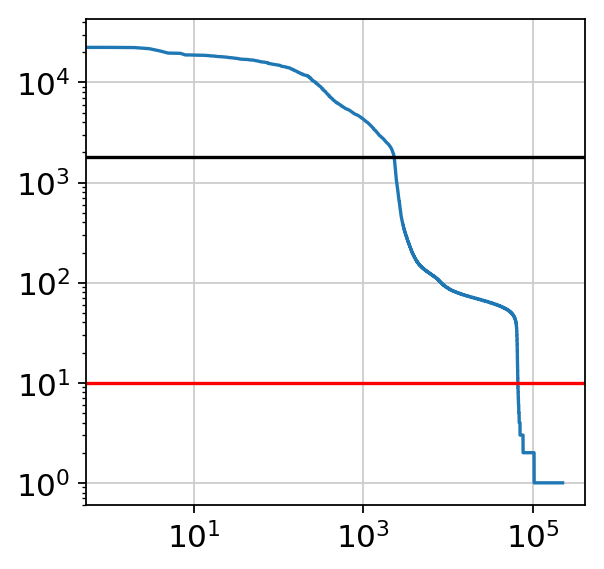

In [224]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [225]:
empty = D367_Biop_Int1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [226]:
D367_Biop_Int1 = D367_Biop_Int1[qc_df_subsetFull.index.tolist()]
D367_Biop_Int1.obs['background'] = back
D367_Biop_Int1.obs['empty_droplets'] = empty.shape[0]

D367_Biop_Int1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


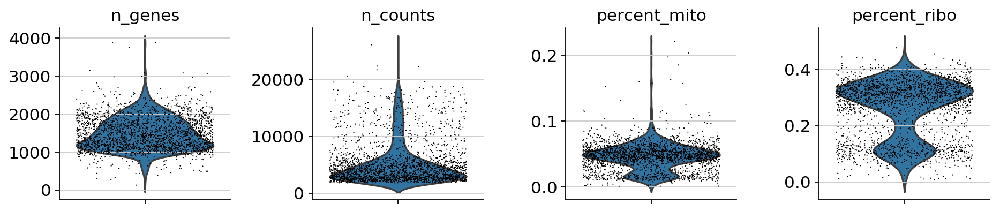

In [227]:
sc.pp.filter_cells(D367_Biop_Int1, min_genes=0)
mito_genes = D367_Biop_Int1.var_names.str.startswith('MT-')
D367_Biop_Int1.obs['percent_mito'] = np.sum(
    D367_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Biop_Int1.X, axis=1).A1
D367_Biop_Int1.obs['n_counts'] = D367_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Biop_Int1.to_df())
ribo_genes = D367_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D367_Biop_Int1.obs['percent_ribo'] = np.sum(
    D367_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Biop_Int1.X, axis=1).A1
D367_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [228]:
sc.pp.filter_cells(D367_Biop_Int1, min_genes=500)
D367_Biop_Int1 = D367_Biop_Int1[D367_Biop_Int1.obs['n_counts'] < 20000, :]
D367_Biop_Int1 = D367_Biop_Int1[D367_Biop_Int1.obs['percent_mito'] < 0.1, :]
sc.pp.normalize_per_cell(D367_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Biop_Int1) # log transform the data
D367_Biop_Int1.raw = D367_Biop_Int1
D367_Biop_Int1_raw = D367_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 12 cells that have less than 500 genes expressed


In [229]:
D367_Biop_Int1 = D367_Biop_Int1[:, D367_Biop_Int1.var['ribo_genes']]
D367_Biop_Int1

View of AnnData object with n_obs × n_vars = 2267 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [230]:
D372_Biop_Int1 = sc.read_10x_mtx(
    './D372_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Int1.var_names_make_unique()
D372_Biop_Int1.obs['manip'] = 'D372_Biop_Int1'
D372_Biop_Int1.obs['position'] = 'Intermediate'
D372_Biop_Int1.obs['method'] = 'Biopsy'
D372_Biop_Int1.obs['donor'] = 'D372'
D372_Biop_Int1.obs['name'] = ['D372_Biop_Int1_' + s for s in list(D372_Biop_Int1.obs.index)]
D372_Biop_Int1.obs_names = D372_Biop_Int1.obs['name']
D372_Biop_Int1

filtered = sc.read_10x_mtx(
    './D372_Biop_Int1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D372_Biop_Int1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D372_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [231]:
D372_Biop_Int1.obs['n_counts'] = D372_Biop_Int1.X.sum(axis=1).A1
sc.pp.filter_cells(D372_Biop_Int1, min_genes=0)
D372_Biop_Int1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [232]:
qc_df = D372_Biop_Int1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(158636, 3)

(1254, 3)
(61898, 3)


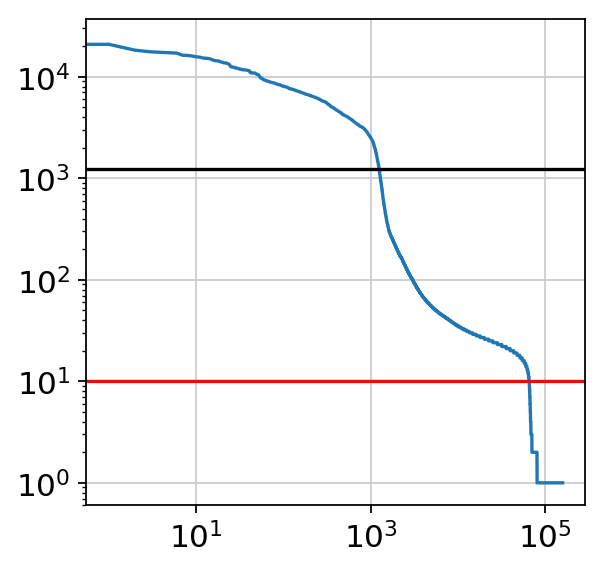

In [233]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [234]:
empty = D372_Biop_Int1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [235]:
D372_Biop_Int1 = D372_Biop_Int1[qc_df_subsetFull.index.tolist()]
D372_Biop_Int1.obs['background'] = back
D372_Biop_Int1.obs['empty_droplets'] = empty.shape[0]

D372_Biop_Int1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


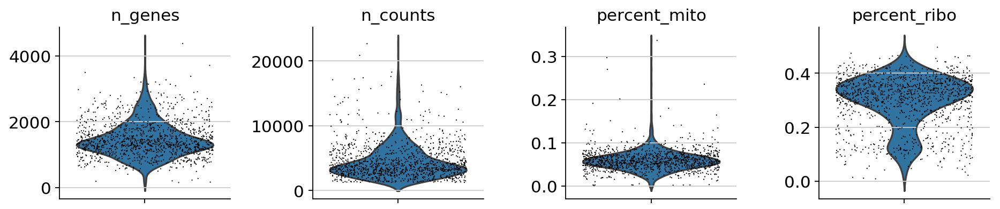

In [236]:
sc.pp.filter_cells(D372_Biop_Int1, min_genes=0)
mito_genes = D372_Biop_Int1.var_names.str.startswith('MT-')
D372_Biop_Int1.obs['percent_mito'] = np.sum(
    D372_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Int1.X, axis=1).A1
D372_Biop_Int1.obs['n_counts'] = D372_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Int1.to_df())
ribo_genes = D372_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Int1.obs['percent_ribo'] = np.sum(
    D372_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Int1.X, axis=1).A1
D372_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [237]:
sc.pp.filter_cells(D372_Biop_Int1, min_genes=500)
D372_Biop_Int1 = D372_Biop_Int1[D372_Biop_Int1.obs['n_counts'] < 20000, :]
D372_Biop_Int1 = D372_Biop_Int1[D372_Biop_Int1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D372_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Int1) # log transform the data
D372_Biop_Int1.raw = D372_Biop_Int1
D372_Biop_Int1_raw = D372_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 8 cells that have less than 500 genes expressed


In [238]:
D372_Biop_Int1 = D372_Biop_Int1[:, D372_Biop_Int1.var['ribo_genes']]
D372_Biop_Int1

View of AnnData object with n_obs × n_vars = 1239 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [239]:
D372_Biop_Int2 = sc.read_10x_mtx(
    './D372_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Int2.var_names_make_unique()
D372_Biop_Int2.obs['manip'] = 'D372_Biop_Int2'
D372_Biop_Int2.obs['position'] = 'Intermediate'
D372_Biop_Int2.obs['method'] = 'Biopsy'
D372_Biop_Int2.obs['donor'] = 'D372'
D372_Biop_Int2.obs['name'] = ['D372_Biop_Int2_' + s for s in list(D372_Biop_Int2.obs.index)]
D372_Biop_Int2.obs_names = D372_Biop_Int2.obs['name']
D372_Biop_Int2

filtered = sc.read_10x_mtx(
    './D372_Biop_Int2/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D372_Biop_Int2-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D372_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [240]:
D372_Biop_Int2.obs['n_counts'] = D372_Biop_Int2.X.sum(axis=1).A1
sc.pp.filter_cells(D372_Biop_Int2, min_genes=0)
D372_Biop_Int2.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [241]:
qc_df = D372_Biop_Int2.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(301891, 3)

(4002, 3)
(16431, 3)


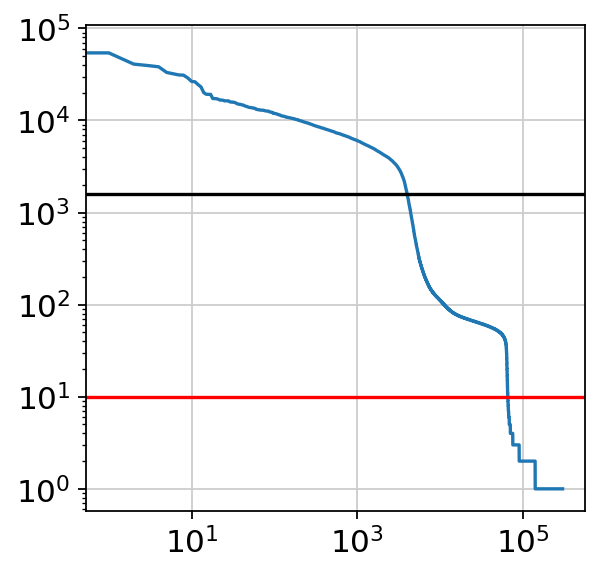

In [242]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [243]:
empty = D372_Biop_Int2[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [244]:
D372_Biop_Int2 = D372_Biop_Int2[qc_df_subsetFull.index.tolist()]
D372_Biop_Int2.obs['background'] = back
D372_Biop_Int2.obs['empty_droplets'] = empty.shape[0]

D372_Biop_Int2.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


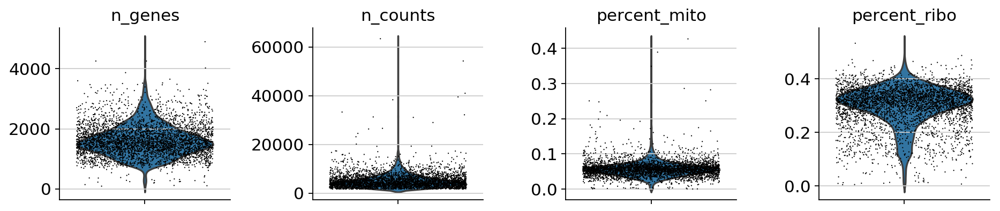

In [245]:
sc.pp.filter_cells(D372_Biop_Int2, min_genes=0)
mito_genes = D372_Biop_Int2.var_names.str.startswith('MT-')
D372_Biop_Int2.obs['percent_mito'] = np.sum(
    D372_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Int2.X, axis=1).A1
D372_Biop_Int2.obs['n_counts'] = D372_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Int2.to_df())
ribo_genes = D372_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Int2.obs['percent_ribo'] = np.sum(
    D372_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Int2.X, axis=1).A1
D372_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [246]:
sc.pp.filter_cells(D372_Biop_Int2, min_genes=500)
D372_Biop_Int2 = D372_Biop_Int2[D372_Biop_Int2.obs['n_counts'] < 20000, :]
D372_Biop_Int2 = D372_Biop_Int2[D372_Biop_Int2.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D372_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Int2) # log transform the data
D372_Biop_Int2.raw = D372_Biop_Int2
D372_Biop_Int2_raw = D372_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 25 cells that have less than 500 genes expressed


In [247]:
D372_Biop_Int2 = D372_Biop_Int2[:, D372_Biop_Int2.var['ribo_genes']]
D372_Biop_Int2

View of AnnData object with n_obs × n_vars = 3954 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

# Distal Brushings
[Back to top](#Full-Aggregate)

In [248]:
D326_Brus_Dis1 = sc.read_10x_mtx(
    './D326_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Brus_Dis1.var_names_make_unique()
D326_Brus_Dis1.obs['manip'] = 'D326_Brus_Dis1'
D326_Brus_Dis1.obs['position'] = 'Distal'
D326_Brus_Dis1.obs['method'] = 'Brushing'
D326_Brus_Dis1.obs['donor'] = 'D326'
D326_Brus_Dis1.obs['name'] = ['D326_Brus_Dis1_' + s for s in list(D326_Brus_Dis1.obs.index)]
D326_Brus_Dis1.obs_names = D326_Brus_Dis1.obs['name']
D326_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D326_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D326_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D326_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [249]:
D326_Brus_Dis1.obs['n_counts'] = D326_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=0)
D326_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [250]:
qc_df = D326_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(147403, 3)

(1249, 3)
(64029, 3)


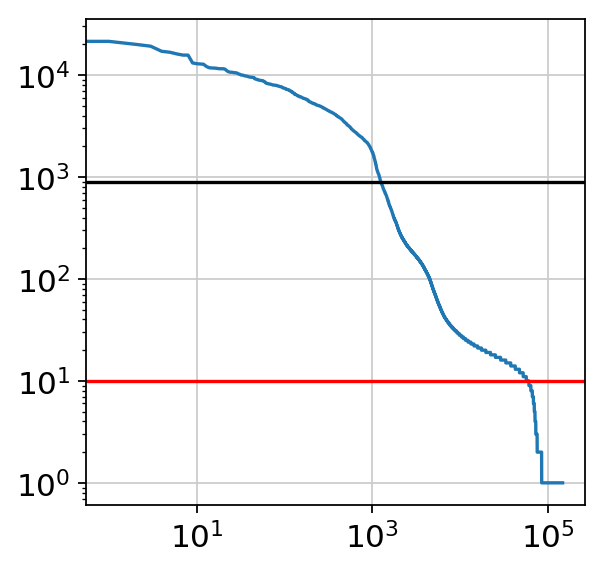

In [251]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [252]:
empty = D326_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [253]:
D326_Brus_Dis1 = D326_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D326_Brus_Dis1.obs['background'] = back
D326_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D326_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


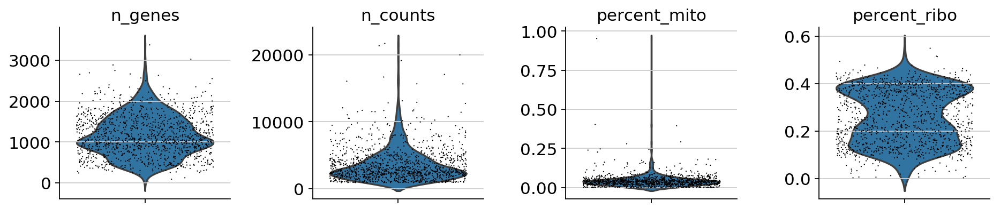

In [254]:
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=0)
mito_genes = D326_Brus_Dis1.var_names.str.startswith('MT-')
D326_Brus_Dis1.obs['percent_mito'] = np.sum(
    D326_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Brus_Dis1.X, axis=1).A1
D326_Brus_Dis1.obs['n_counts'] = D326_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Brus_Dis1.to_df())
ribo_genes = D326_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D326_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D326_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Brus_Dis1.X, axis=1).A1
D326_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [255]:
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=500)
D326_Brus_Dis1 = D326_Brus_Dis1[D326_Brus_Dis1.obs['n_counts'] < 15000, :]
D326_Brus_Dis1 = D326_Brus_Dis1[D326_Brus_Dis1.obs['percent_mito'] < 0.25 , :]
sc.pp.normalize_per_cell(D326_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Brus_Dis1) # log transform the data
D326_Brus_Dis1.raw = D326_Brus_Dis1
D326_Brus_Dis1_raw = D326_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 125 cells that have less than 500 genes expressed


In [256]:
D326_Brus_Dis1 = D326_Brus_Dis1[:, D326_Brus_Dis1.var['ribo_genes']]
D326_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1114 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [257]:
D337_Brus_Dis1 = sc.read_10x_mtx(
    './D337_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D337_Brus_Dis1.var_names_make_unique()
D337_Brus_Dis1.obs['manip'] = 'D337_Brus_Dis1'
D337_Brus_Dis1.obs['position'] = 'Distal'
D337_Brus_Dis1.obs['method'] = 'Brushing'
D337_Brus_Dis1.obs['donor'] = 'D337'
D337_Brus_Dis1.obs['name'] = ['D337_Brus_Dis1' + s for s in list(D337_Brus_Dis1.obs.index)]
D337_Brus_Dis1.obs_names = D337_Brus_Dis1.obs['name']
D337_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D337_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D337_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D337_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [258]:
D337_Brus_Dis1.obs['n_counts'] = D337_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=0)
D337_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [259]:
qc_df = D337_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(338212, 3)

(1427, 3)
(4443, 3)


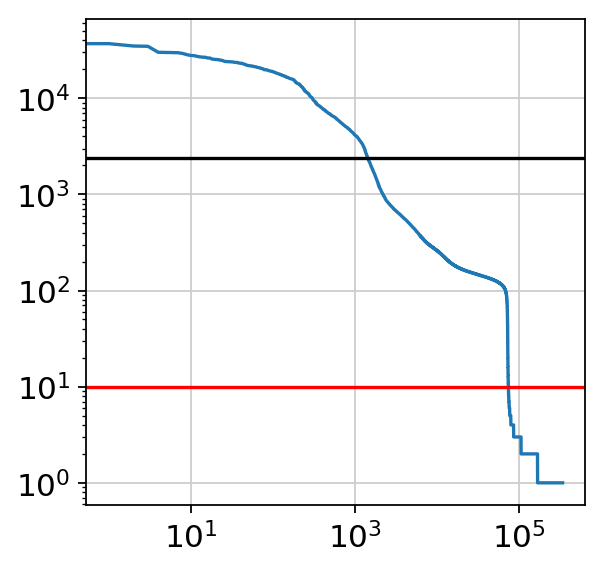

In [260]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [261]:
empty = D337_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [262]:
D337_Brus_Dis1 = D337_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D337_Brus_Dis1.obs['background'] = back
D337_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D337_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


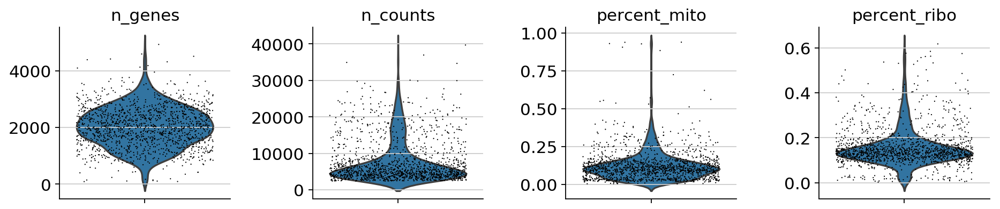

In [263]:
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=0)
mito_genes = D337_Brus_Dis1.var_names.str.startswith('MT-')
D337_Brus_Dis1.obs['percent_mito'] = np.sum(
    D337_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D337_Brus_Dis1.X, axis=1).A1
D337_Brus_Dis1.obs['n_counts'] = D337_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D337_Brus_Dis1.to_df())
ribo_genes = D337_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D337_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D337_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D337_Brus_Dis1.X, axis=1).A1
D337_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D337_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [264]:
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=500)
D337_Brus_Dis1 = D337_Brus_Dis1[D337_Brus_Dis1.obs['n_counts'] < 30000, :]
D337_Brus_Dis1 = D337_Brus_Dis1[D337_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D337_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D337_Brus_Dis1) # log transform the data
D337_Brus_Dis1.raw = D337_Brus_Dis1
D337_Brus_Dis1_raw = D337_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 17 cells that have less than 500 genes expressed


In [265]:
D337_Brus_Dis1 = D337_Brus_Dis1[:, D337_Brus_Dis1.var['ribo_genes']]
D337_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1397 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [266]:
D339_Brus_Dis1 = sc.read_10x_mtx(
    './D339_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Brus_Dis1.var_names_make_unique()
D339_Brus_Dis1.obs['manip'] = 'D339_Brus_Dis1'
D339_Brus_Dis1.obs['position'] = 'Distal'
D339_Brus_Dis1.obs['method'] = 'Brushing'
D339_Brus_Dis1.obs['donor'] = 'D339'
D339_Brus_Dis1.obs['name'] = ['D339_Brus_Dis1_' + s for s in list(D339_Brus_Dis1.obs.index)]
D339_Brus_Dis1.obs_names = D339_Brus_Dis1.obs['name']
D339_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D339_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D339_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D339_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [267]:
D339_Brus_Dis1.obs['n_counts'] = D339_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=0)
D339_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [268]:
qc_df = D339_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(171647, 3)

(1379, 3)
(75985, 3)


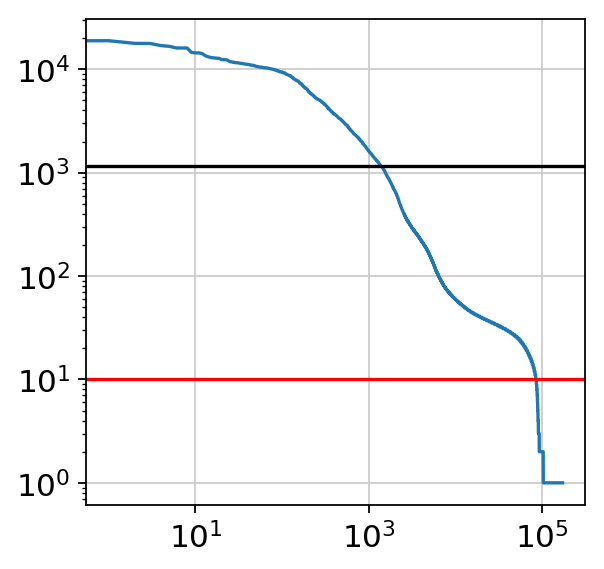

In [269]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [270]:
empty = D339_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [271]:
D339_Brus_Dis1 = D339_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D339_Brus_Dis1.obs['background'] = back
D339_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D339_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


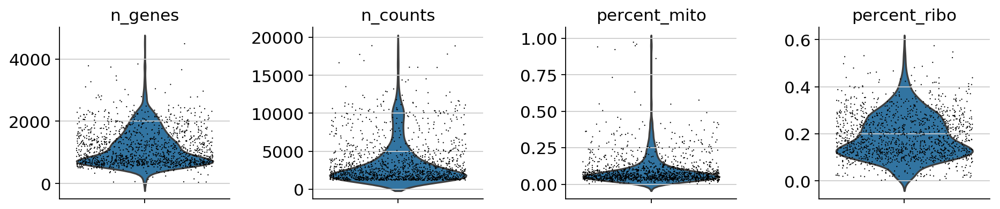

In [272]:
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=0)
mito_genes = D339_Brus_Dis1.var_names.str.startswith('MT-')
D339_Brus_Dis1.obs['percent_mito'] = np.sum(
    D339_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Brus_Dis1.X, axis=1).A1
D339_Brus_Dis1.obs['n_counts'] = D339_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Brus_Dis1.to_df())
ribo_genes = D339_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D339_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D339_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Brus_Dis1.X, axis=1).A1
D339_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [273]:
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=500)
D339_Brus_Dis1 = D339_Brus_Dis1[D339_Brus_Dis1.obs['n_counts'] < 15000, :]
D339_Brus_Dis1 = D339_Brus_Dis1[D339_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D339_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Brus_Dis1) # log transform the data
D339_Brus_Dis1.raw = D339_Brus_Dis1
D339_Brus_Dis1_raw = D339_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 35 cells that have less than 500 genes expressed


In [274]:
D339_Brus_Dis1 = D339_Brus_Dis1[:, D339_Brus_Dis1.var['ribo_genes']]
D339_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1332 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [275]:
D344_Brus_Dis1 = sc.read_10x_mtx(
    './D344_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Brus_Dis1.var_names_make_unique()
D344_Brus_Dis1.obs['manip'] = 'D344_Brus_Dis1'
D344_Brus_Dis1.obs['position'] = 'Distal'
D344_Brus_Dis1.obs['method'] = 'Brushing'
D344_Brus_Dis1.obs['donor'] = 'D344'
D344_Brus_Dis1.obs['name'] = ['D344_Brus_Dis1_' + s for s in list(D344_Brus_Dis1.obs.index)]
D344_Brus_Dis1.obs_names = D344_Brus_Dis1.obs['name']
D344_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D344_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D344_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D344_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [276]:
D344_Brus_Dis1.obs['n_counts'] = D344_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=0)
D344_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [277]:
qc_df = D344_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(463730, 3)

(2815, 3)
(23565, 3)


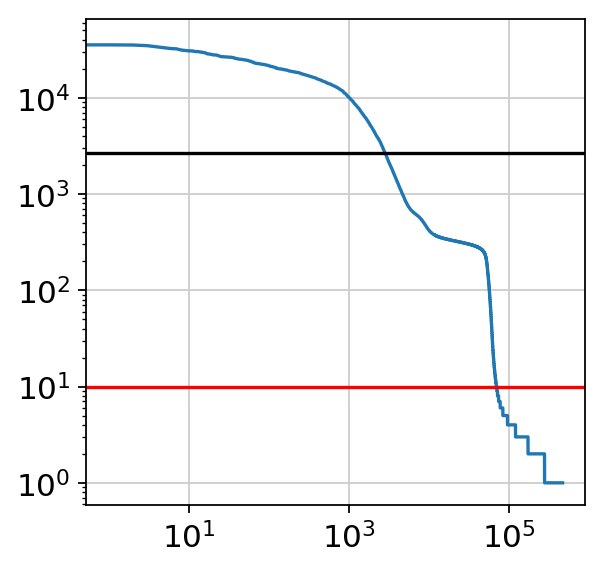

In [278]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [279]:
empty = D344_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [280]:
D344_Brus_Dis1 = D344_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D344_Brus_Dis1.obs['background'] = back
D344_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D344_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


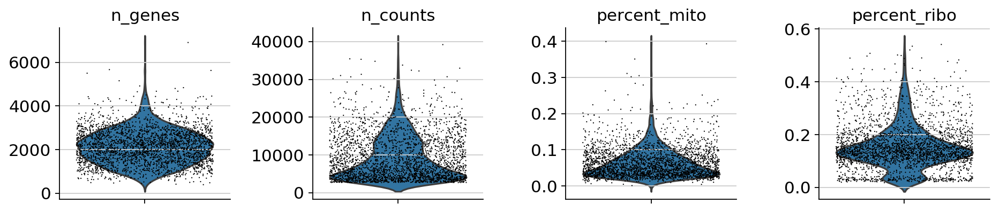

In [281]:
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=0)
mito_genes = D344_Brus_Dis1.var_names.str.startswith('MT-')
D344_Brus_Dis1.obs['percent_mito'] = np.sum(
    D344_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Brus_Dis1.X, axis=1).A1
D344_Brus_Dis1.obs['n_counts'] = D344_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Brus_Dis1.to_df())
ribo_genes = D344_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D344_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D344_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Brus_Dis1.X, axis=1).A1
D344_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [282]:
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=500)
D344_Brus_Dis1 = D344_Brus_Dis1[D344_Brus_Dis1.obs['n_counts'] < 30000, :]
D344_Brus_Dis1 = D344_Brus_Dis1[D344_Brus_Dis1.obs['percent_mito'] < 0.3 , :]
sc.pp.normalize_per_cell(D344_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Brus_Dis1) # log transform the data
D344_Brus_Dis1.raw = D344_Brus_Dis1
D344_Brus_Dis1_raw = D344_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 8 cells that have less than 500 genes expressed


In [283]:
D344_Brus_Dis1 = D344_Brus_Dis1[:, D344_Brus_Dis1.var['ribo_genes']]
D344_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2787 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [284]:
D353_Brus_Dis1 = sc.read_10x_mtx(
    './D353_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Brus_Dis1.var_names_make_unique()
D353_Brus_Dis1.obs['manip'] = 'D353_Brus_Dis1'
D353_Brus_Dis1.obs['position'] = 'Distal'
D353_Brus_Dis1.obs['method'] = 'Brushing'
D353_Brus_Dis1.obs['donor'] = 'D353'
D353_Brus_Dis1.obs['name'] = ['D353_Brus_Dis1_' + s for s in list(D353_Brus_Dis1.obs.index)]
D353_Brus_Dis1.obs_names = D353_Brus_Dis1.obs['name']
D353_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D353_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D353_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D353_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [285]:
D353_Brus_Dis1.obs['n_counts'] = D353_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=0)
D353_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [286]:
qc_df = D353_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(329942, 3)

(4786, 3)
(14738, 3)


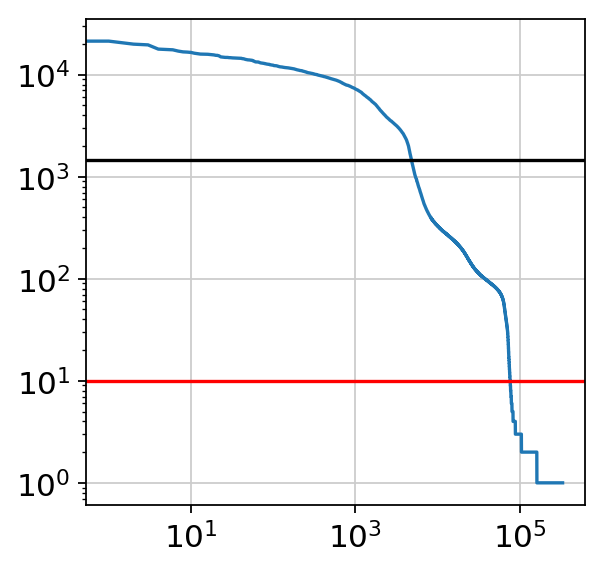

In [287]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [288]:
empty = D353_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [289]:
D353_Brus_Dis1 = D353_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D353_Brus_Dis1.obs['background'] = back
D353_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D353_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


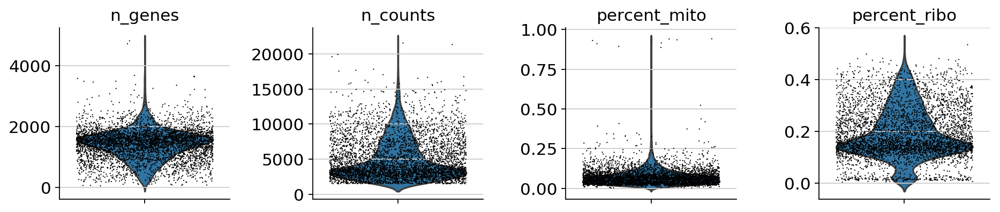

In [290]:
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=0)
mito_genes = D353_Brus_Dis1.var_names.str.startswith('MT-')
D353_Brus_Dis1.obs['percent_mito'] = np.sum(
    D353_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Brus_Dis1.X, axis=1).A1
D353_Brus_Dis1.obs['n_counts'] = D353_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Brus_Dis1.to_df())
ribo_genes = D353_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D353_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D353_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Brus_Dis1.X, axis=1).A1
D353_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [291]:
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=500)
D353_Brus_Dis1 = D353_Brus_Dis1[D353_Brus_Dis1.obs['n_counts'] < 20000, :]
D353_Brus_Dis1 = D353_Brus_Dis1[D353_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D353_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Brus_Dis1) # log transform the data
D353_Brus_Dis1.raw = D353_Brus_Dis1
D353_Brus_Dis1_raw = D353_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 199 cells that have less than 500 genes expressed


In [292]:
D353_Brus_Dis1 = D353_Brus_Dis1[:, D353_Brus_Dis1.var['ribo_genes']]
D353_Brus_Dis1

View of AnnData object with n_obs × n_vars = 4585 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [293]:
D354_Brus_Dis1 = sc.read_10x_mtx(
    './D354_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Brus_Dis1.var_names_make_unique()
D354_Brus_Dis1.obs['manip'] = 'D354_Brus_Dis1'
D354_Brus_Dis1.obs['position'] = 'Distal'
D354_Brus_Dis1.obs['method'] = 'Brushing'
D354_Brus_Dis1.obs['donor'] = 'D354'
D354_Brus_Dis1.obs['name'] = ['D354_Brus_Dis1_' + s for s in list(D354_Brus_Dis1.obs.index)]
D354_Brus_Dis1.obs_names = D354_Brus_Dis1.obs['name']
D354_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D354_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D354_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D354_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [294]:
D354_Brus_Dis1.obs['n_counts'] = D354_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=0)
D354_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [295]:
qc_df = D354_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(429037, 3)

(2673, 3)
(11969, 3)


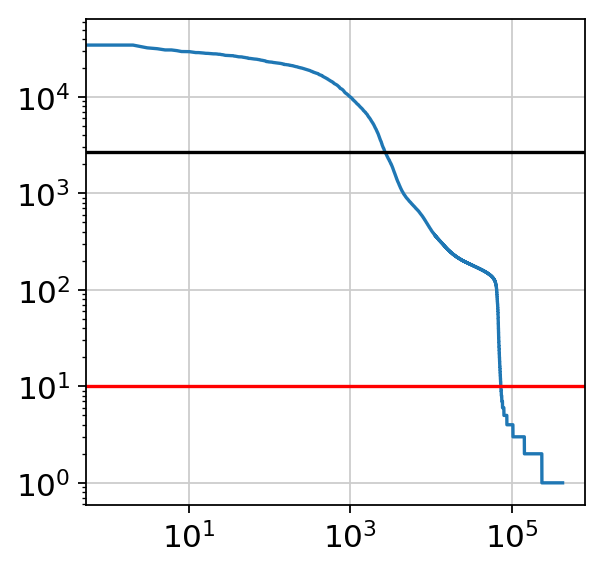

In [296]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [297]:
empty = D354_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [298]:
D354_Brus_Dis1 = D354_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D354_Brus_Dis1.obs['background'] = back
D354_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D354_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


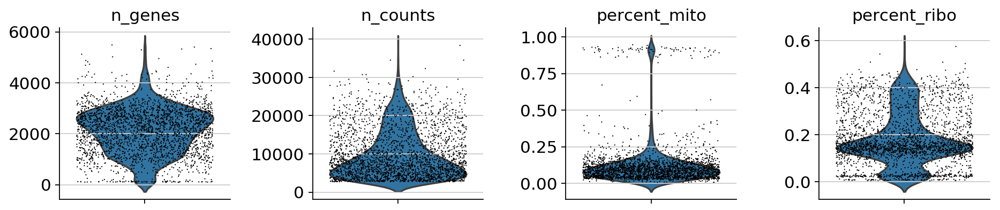

In [299]:
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=0)
mito_genes = D354_Brus_Dis1.var_names.str.startswith('MT-')
D354_Brus_Dis1.obs['percent_mito'] = np.sum(
    D354_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D354_Brus_Dis1.X, axis=1).A1
D354_Brus_Dis1.obs['n_counts'] = D354_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Brus_Dis1.to_df())
ribo_genes = D354_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D354_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D354_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Brus_Dis1.X, axis=1).A1
D354_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [300]:
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=500)
D354_Brus_Dis1 = D354_Brus_Dis1[D354_Brus_Dis1.obs['n_counts'] < 30000, :]
D354_Brus_Dis1 = D354_Brus_Dis1[D354_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D354_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Brus_Dis1) # log transform the data
D354_Brus_Dis1.raw = D354_Brus_Dis1
D354_Brus_Dis1_raw = D354_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 106 cells that have less than 500 genes expressed


In [301]:
D354_Brus_Dis1 = D354_Brus_Dis1[:, D354_Brus_Dis1.var['ribo_genes']]
D354_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2555 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [302]:
D363_Brus_Dis1 = sc.read_10x_mtx(
    './D363_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Brus_Dis1.var_names_make_unique()
D363_Brus_Dis1.obs['manip'] = 'D363_Brus_Dis1'
D363_Brus_Dis1.obs['position'] = 'Distal'
D363_Brus_Dis1.obs['method'] = 'Brushing'
D363_Brus_Dis1.obs['donor'] = 'D363'
D363_Brus_Dis1.obs['name'] = ['D363_Brus_Dis1_' + s for s in list(D363_Brus_Dis1.obs.index)]
D363_Brus_Dis1.obs_names = D363_Brus_Dis1.obs['name']
D363_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D363_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D363_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D363_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [303]:
D363_Brus_Dis1.obs['n_counts'] = D363_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=0)
D363_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [304]:
qc_df = D363_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(299268, 3)

(1635, 3)
(10371, 3)


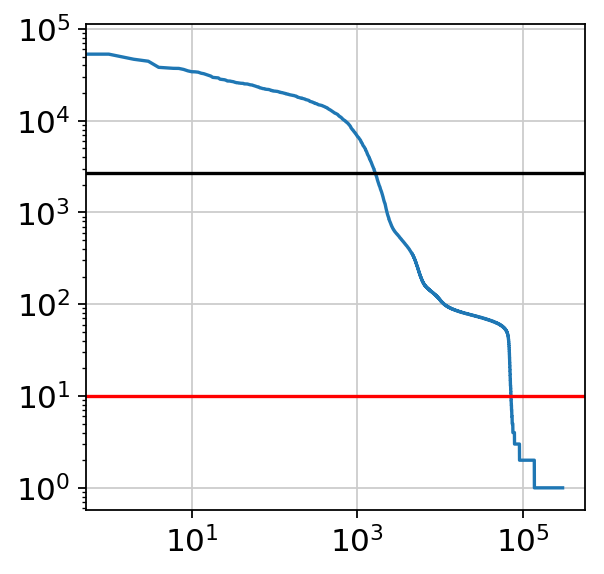

In [305]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [306]:
empty = D363_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [307]:
D363_Brus_Dis1 = D363_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D363_Brus_Dis1.obs['background'] = back
D363_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D363_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


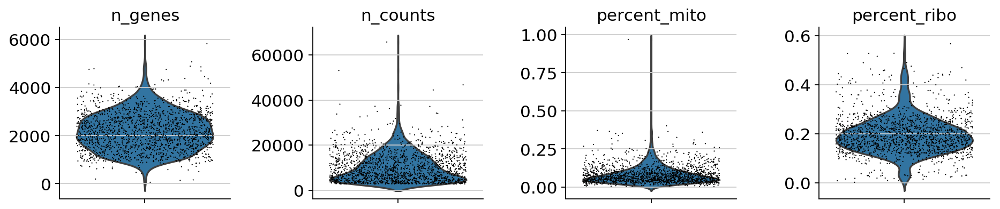

In [308]:
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=0)
mito_genes = D363_Brus_Dis1.var_names.str.startswith('MT-')
D363_Brus_Dis1.obs['percent_mito'] = np.sum(
    D363_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Brus_Dis1.X, axis=1).A1
D363_Brus_Dis1.obs['n_counts'] = D363_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Brus_Dis1.to_df())
ribo_genes = D363_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D363_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D363_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Brus_Dis1.X, axis=1).A1
D363_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [309]:
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=500)
D363_Brus_Dis1 = D363_Brus_Dis1[D363_Brus_Dis1.obs['n_counts'] < 40000, :]
D363_Brus_Dis1 = D363_Brus_Dis1[D363_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D363_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Brus_Dis1) # log transform the data
D363_Brus_Dis1.raw = D363_Brus_Dis1
D363_Brus_Dis1_raw = D363_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 7 cells that have less than 500 genes expressed


In [310]:
D363_Brus_Dis1 = D363_Brus_Dis1[:, D363_Brus_Dis1.var['ribo_genes']]
D363_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1624 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [311]:
D367_Brus_Dis1 = sc.read_10x_mtx(
    './D367_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Brus_Dis1.var_names_make_unique()
D367_Brus_Dis1.obs['manip'] = 'D367_Brus_Dis1'
D367_Brus_Dis1.obs['position'] = 'Distal'
D367_Brus_Dis1.obs['method'] = 'Brushing'
D367_Brus_Dis1.obs['donor'] = 'D367'
D367_Brus_Dis1.obs['name'] = ['D367_Brus_Dis1_' + s for s in list(D367_Brus_Dis1.obs.index)]
D367_Brus_Dis1.obs_names = D367_Brus_Dis1.obs['name']
D367_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D367_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D367_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D367_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [312]:
D367_Brus_Dis1.obs['n_counts'] = D367_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=0)
D367_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [313]:
qc_df = D367_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(419183, 3)

(2191, 3)
(3119, 3)


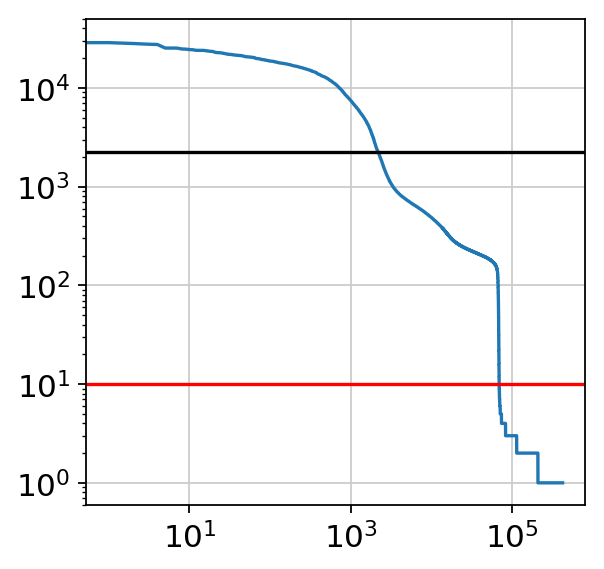

In [314]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [315]:
empty = D367_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [316]:
D367_Brus_Dis1 = D367_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D367_Brus_Dis1.obs['background'] = back
D367_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D367_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


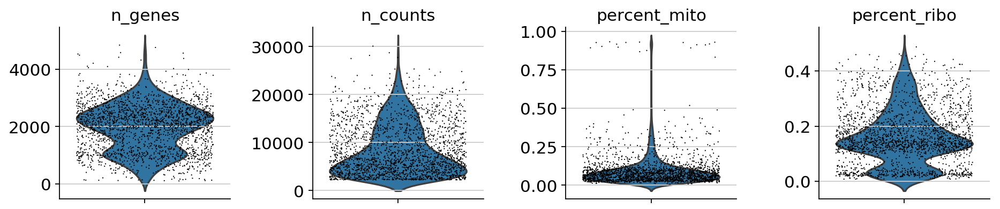

In [317]:
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=0)
mito_genes = D367_Brus_Dis1.var_names.str.startswith('MT-')
D367_Brus_Dis1.obs['percent_mito'] = np.sum(
    D367_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Brus_Dis1.X, axis=1).A1
D367_Brus_Dis1.obs['n_counts'] = D367_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Brus_Dis1.to_df())
ribo_genes = D367_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D367_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D367_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Brus_Dis1.X, axis=1).A1
D367_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [318]:
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=500)
D367_Brus_Dis1 = D367_Brus_Dis1[D367_Brus_Dis1.obs['n_counts'] < 25000, :]
D367_Brus_Dis1 = D367_Brus_Dis1[D367_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D367_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Brus_Dis1) # log transform the data
D367_Brus_Dis1.raw = D367_Brus_Dis1
D367_Brus_Dis1_raw = D367_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 63 cells that have less than 500 genes expressed


In [319]:
D367_Brus_Dis1 = D367_Brus_Dis1[:, D367_Brus_Dis1.var['ribo_genes']]
D367_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2119 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

In [320]:
D372_Brus_Dis1 = sc.read_10x_mtx(
    './D372_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Brus_Dis1.var_names_make_unique()
D372_Brus_Dis1.obs['manip'] = 'D372_Brus_Dis1'
D372_Brus_Dis1.obs['position'] = 'Distal'
D372_Brus_Dis1.obs['method'] = 'Brushing'
D372_Brus_Dis1.obs['donor'] = 'D372'
D372_Brus_Dis1.obs['name'] = ['D372_Brus_Dis1_' + s for s in list(D372_Brus_Dis1.obs.index)]
D372_Brus_Dis1.obs_names = D372_Brus_Dis1.obs['name']
D372_Brus_Dis1

filtered = sc.read_10x_mtx(
    './D372_Brus_Dis1/' + outsPathFilter, 
    var_names='gene_symbols', 
    cache=True) 
minCount = min(filtered.X.sum(axis=1).A1)

... reading from cache file ./cache/D372_Brus_Dis1-outs-raw_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad
... reading from cache file ./cache/D372_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


In [321]:
D372_Brus_Dis1.obs['n_counts'] = D372_Brus_Dis1.X.sum(axis=1).A1
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=0)
D372_Brus_Dis1.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 737280 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes'
    var: 'gene_ids'>

In [322]:
qc_df = D372_Brus_Dis1.obs[['n_genes','n_counts']]
qc_df = qc_df.sort_values(by = 'n_counts', ascending = False)
qc_df['cell_nb'] = range(0, qc_df.shape[0])
qc_df = qc_df[qc_df['n_counts'] > 0]
qc_df.shape

(356751, 3)

(1754, 3)
(5796, 3)


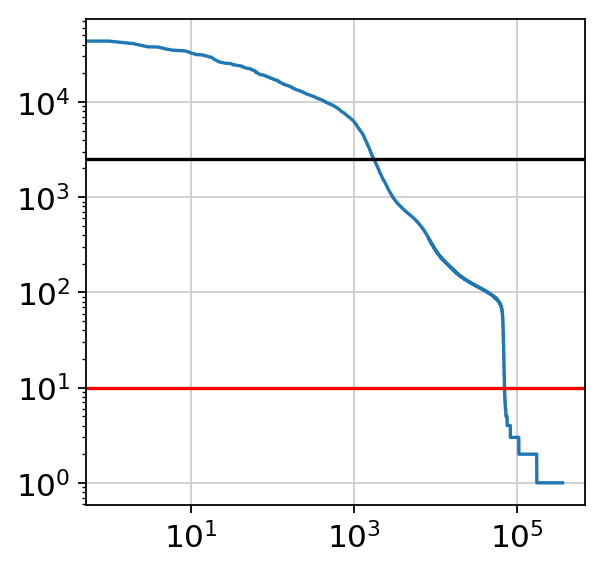

In [323]:
qc_df_subsetFull = qc_df[qc_df['n_counts'] > minCount]
print(qc_df_subsetFull.shape)

qc_df_subsetEmpty = qc_df[qc_df['n_counts'] <= 50]
qc_df_subsetEmpty = qc_df_subsetEmpty[qc_df_subsetEmpty['n_counts'] > 5]
print(qc_df_subsetEmpty.shape)

fig, ax = plt.subplots()
ax.plot(qc_df[['cell_nb']], qc_df[['n_counts']])
ax.set_xscale('log'); ax.set_yscale('log')
plt.axhline(y=10, color='r') # Limit to empty droplets
plt.axhline(y=minCount, color='k') # Limit to filtered dataset
plt.show()

In [324]:
empty = D372_Brus_Dis1[qc_df_subsetEmpty.index.tolist()]
empty.var['n_cells'] = empty.X.sum(axis=0).A1
back = sum(empty.var['n_cells'])/empty.shape[0] # Background score for the sample
#empty.var.sort_values(by = 'n_cells', ascending = False).iloc[0:50].index.tolist()

In [325]:
D372_Brus_Dis1 = D372_Brus_Dis1[qc_df_subsetFull.index.tolist()]
D372_Brus_Dis1.obs['background'] = back
D372_Brus_Dis1.obs['empty_droplets'] = empty.shape[0]

D372_Brus_Dis1.var['background_gene'] = empty.var['n_cells']

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


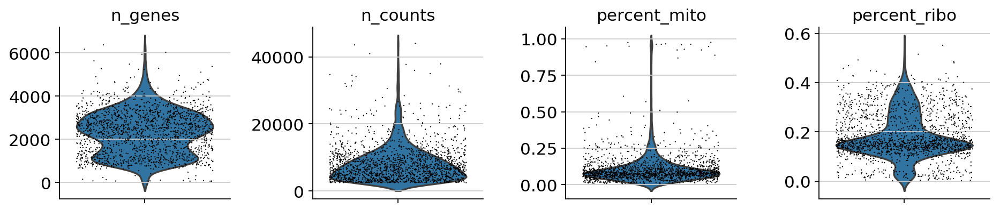

In [326]:
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=0)
mito_genes = D372_Brus_Dis1.var_names.str.startswith('MT-')
D372_Brus_Dis1.obs['percent_mito'] = np.sum(
    D372_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Brus_Dis1.X, axis=1).A1
D372_Brus_Dis1.obs['n_counts'] = D372_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Brus_Dis1.to_df())
ribo_genes = D372_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D372_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D372_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Brus_Dis1.X, axis=1).A1
D372_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [327]:
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=500)
D372_Brus_Dis1 = D372_Brus_Dis1[D372_Brus_Dis1.obs['n_counts'] < 30000, :]
D372_Brus_Dis1 = D372_Brus_Dis1[D372_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D372_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Brus_Dis1) # log transform the data
D372_Brus_Dis1.raw = D372_Brus_Dis1
D372_Brus_Dis1_raw = D372_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 19 cells that have less than 500 genes expressed


In [328]:
D372_Brus_Dis1 = D372_Brus_Dis1[:, D372_Brus_Dis1.var['ribo_genes']]
D372_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1714 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_counts', 'n_genes', 'background', 'empty_droplets', 'percent_mito', 'percent_ribo'
    var: 'gene_ids', 'background_gene', 'ribo_genes'

***

# Concatenate full dataset
[Back to top](#Full-Aggregate)

In [329]:
adata = D322_Biop_Nas1.concatenate(D322_Biop_Pro1, D322_Biop_Int1, 
                                   D326_Biop_Pro1, D326_Biop_Int1, D326_Brus_Dis1,
                                   D337_Brus_Dis1,
                                   D339_Biop_Nas1, D339_Biop_Pro1, D339_Biop_Int1, D339_Brus_Dis1,
                                   D344_Biop_Nas1, D344_Biop_Pro1, D344_Biop_Int1, D344_Brus_Dis1,
                                   D345_Biop_Nas1,
                                   D353_Brus_Nas1, D353_Biop_Pro1, D353_Biop_Int2, D353_Brus_Dis1,
                                   D354_Biop_Pro1, D354_Biop_Int2, D354_Brus_Dis1,
                                   D363_Brus_Nas1, D363_Biop_Pro1, D363_Biop_Int2, D363_Brus_Dis1,
                                   D367_Brus_Nas1, D367_Biop_Pro1, D367_Biop_Int1, D367_Brus_Dis1,
                                   D372_Brus_Nas1, D372_Biop_Pro1, D372_Biop_Int1, D372_Biop_Int2, D372_Brus_Dis1,
                                   join='inner')

In [331]:
adata.obs.to_csv(path_or_buf = '/Data/background_metadata.tsv', 
                 sep = '\t')
adata.var.to_csv(path_or_buf = '/Data/background_features.tsv', 
                 sep = '\t')

In [332]:
adata.obs[['manip','background', 'position']].drop_duplicates().sort_values(by = 'position')

,manip,background,position
D372_Brus_Dis1_GCTGGGTAGCCACGCT-1-35,D372_Brus_Dis1,17.812802,Distal
D353_Brus_Dis1_GGGTCTGAGCAAATCA-1-19,D353_Brus_Dis1,23.498914,Distal
D344_Brus_Dis1_CAAGATCCATCACCCT-1-14,D344_Brus_Dis1,12.913983,Distal
D363_Brus_Dis1_TCGAGGCTCAGTTAGC-1-26,D363_Brus_Dis1,27.658374,Distal
D354_Brus_Dis1_CCTTCCCGTTGGTTTG-1-22,D354_Brus_Dis1,13.786866,Distal
D367_Brus_Dis1_AACTTTCTCGGTCCGA-1-30,D367_Brus_Dis1,13.430266,Distal
D339_Brus_Dis1_CATGGCGTCCCATTAT-1-10,D339_Brus_Dis1,25.748371,Distal
D326_Brus_Dis1_TTTCCTCCAACGCACC-1-5,D326_Brus_Dis1,15.834778,Distal
D337_Brus_Dis1CTGCTGTTCTTAGCCC-1-6,D337_Brus_Dis1,12.932478,Distal
D367_Biop_Int1_CCCATACGTGCACCAC-1-29,D367_Biop_Int1,37.036659,Intermediate
